# Libraries, figure parameters and custom functions

In [5]:
import scanpy as sc
import numpy as np
import pandas as pd
import anndata as ann
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import colors
from matplotlib import rcParams
#from gprofiler import gprofiler
import os
#import custom_functions as cf

Add date.

In [6]:
from datetime import date

In [7]:
today = date.today().strftime("%y%m%d")

In [8]:
print(today)

221111


Add my color scheme.

In [9]:
colors2 = plt.cm.RdYlBu_r(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(0.7)
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

Set parameters for plots in scanpy

In [10]:
sc.settings.set_figure_params(dpi=80)

sc.set_figure_params(scanpy=True, dpi=80, dpi_save=250,
                     frameon=True, vector_friendly=True,
                     color_map='viridis', format='pdf', transparent=False,
                     ipython_format='png2x')

In [11]:
def cell_compo_table(adata, cluster, condition, xlabel='cell cluster',
                        ylabel='cell count', title=None, save=False):
    """
    """
    

    contingency_table = pd.crosstab(
        adata.obs[condition],
        adata.obs[cluster],
        margins = True
    )
    return(contingency_table)

def top_marker_as_xlsx(adata, key_rank_genes, key_groups, output_file):
    
    print(adata.uns[key_rank_genes].keys())
    dict_genes = adata.uns[key_rank_genes].copy()
    print(dict_genes['params'])
    del dict_genes['params']
    clusters = sorted(list(set(adata.obs[key_groups])))*len(dict_genes['scores'])
    for key, value in dict_genes.items():
        tmp_list = []
        for n in value:
            tmp_list = tmp_list + list(n)
        dict_genes[key] = tmp_list
    
    dict_genes['cluster'] = clusters

    dataframe = pd.DataFrame(dict_genes)
    dataframe.to_excel(output_file)
    return(dataframe)

# Load data

In [12]:
project_dir = '/lustre/groups/ml01/workspace/maren.buettner/Martinez_Liver_HPC/'

In [13]:
data_dir = project_dir + 'data/'

In [23]:
table_dir = project_dir + 'tables/'

In [14]:
adata_wt_young = sc.read(data_dir + 'snRNAseq_mouse_hepatocytes_young_cells_filtered_TPM_jul21_annotated.h5ad')
adata_wt_old = sc.read(data_dir + 'snRNAseq_mouse_hepatocytes_old_cells_filtered_TPM_jul21_annotated.h5ad')

In [15]:
adata_young_HNF4 = sc.read(data_dir + 'snRNAseq_mouse_hepatocytes_young_HNF4-KO_filtered_TPM_jul21_annotated.h5ad')
adata_old_HNF4 = sc.read(data_dir + 'snRNAseq_mouse_hepatocytes_old_HNF4-KO_filtered_TPM_jul21_annotated.h5ad')
adata_young_CTCF = sc.read(data_dir + 'snRNAseq_mouse_hepatocytes_young_CTCF-KO_filtered_TPM_jul21_annotated.h5ad')
adata_old_CTCF = sc.read(data_dir + 'snRNAseq_mouse_hepatocytes_old_CTCF-KO_filtered_TPM_jul21_annotated.h5ad' )
adata_young_CEBPA = sc.read(data_dir + 'snRNAseq_mouse_hepatocytes_young_CEBPA-KO_filtered_TPM_jul21_annotated.h5ad')
adata_old_CEBPA = sc.read(data_dir + 'snRNAseq_mouse_hepatocytes_old_CEBPA-KO_filtered_TPM_jul21_annotated.h5ad')

We merge `adata_young` and `adata_old` in order to use the separately created cell type annotation.

In [16]:
adata = ann.concat([adata_wt_young, adata_wt_old, 
                        adata_young_HNF4, adata_old_HNF4,
                        adata_young_CTCF, adata_old_CTCF,
                        adata_young_CEBPA, adata_old_CEBPA,
                       ], index_unique=None)

In [17]:
adata.uns = adata_wt_young.uns
adata.var['gene_name'] = adata_wt_young.var['gene_name']
adata.var['length'] = adata_wt_young.var['length'] 

In [18]:
adata.obs['strain'] = adata.obs['strain'].astype('category')

In [19]:
#adata.var_names = adata.var['gene_name'].astype('str')

In [20]:
adata.var_names_make_unique()

Edit the raw object to use the gene symbols for plotting (e.g. in `stacked_violin` plot).

In [21]:
adata.raw.var['gene_name'] = adata_wt_young.var['gene_name']

Get p-values for the following list of genes. Check the following comparisons:

* 2n young vs 2n old 
* 4n young vs 4n old
* 2n old vs 4n old

per strain.

In [24]:
up_4n_hemi_ko = pd.read_table(table_dir + 'List_up in 4n hemizygous KOs.csv',sep=';')
up_hemi_ko = pd.read_table(table_dir + 'List_up in hemizygous KOs.csv',sep=';')

# Target gene expression in hepatocyte KOs

Add covariate combining age, strain and ploidy information for all cells.

In [21]:
age_strain_ploidy = [adata.obs['ploidy'][idx] + '_' + adata.obs['age_grouped'][idx] + '_' + adata.obs['strain'][idx] for idx in range(adata.n_obs)]

In [22]:
adata.obs['ploidy_age_strain'] = pd.Categorical(age_strain_ploidy)

In [23]:
cell_compo_table(adata, 'strain', 'ploidy_age_strain')

strain,C57Bl6/J,CEBPA KO,CTCF KO,HNF4 KO,All
ploidy_age_strain,,,,,
2n_old_C57Bl6/J,598,0,0,0,598
2n_old_CEBPA KO,0,494,0,0,494
2n_old_CTCF KO,0,0,258,0,258
2n_old_HNF4 KO,0,0,0,249,249
2n_young_C57Bl6/J,840,0,0,0,840
2n_young_CEBPA KO,0,491,0,0,491
2n_young_CTCF KO,0,0,257,0,257
2n_young_HNF4 KO,0,0,0,254,254
4n_old_C57Bl6/J,577,0,0,0,577


In [24]:
adata_tmp = adata[adata.obs['cell_type1']=='Hepatocytes'].copy()


In [23]:
adata_tmp.obs['ploidy_age_strain'].value_counts().to_csv(table_dir + today + '_cell_counts_age_strain_ploidy_hepatocytes.csv')

/home/icb/maren.buettner/anaconda3/envs/scanpy1-6/lib/python3.8/site-packages/anndata/_core/anndata.py:1207: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'exp.' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'age' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'sex' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'row' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'age_grouped' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'cyclone_phases' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'leiden_r1' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'leidenr02_02' as categorical
/home/icb/maren.buettner/anaconda3/envs/scanpy1-6/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass 

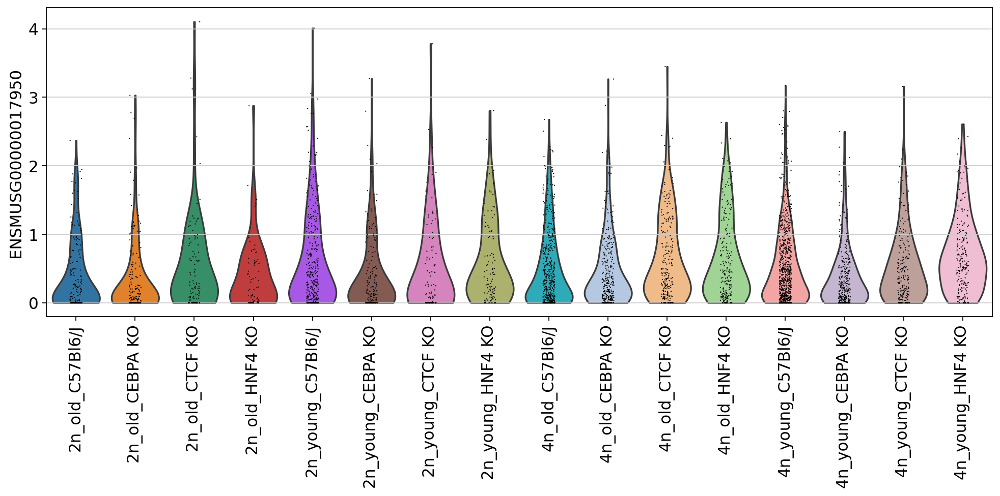

In [24]:
rcParams['figure.figsize']=(12,5)
sc.pl.violin(adata[adata.obs['cell_type1']=='Hepatocytes'], 
             gene_symbols='gene_name', groupby='ploidy_age_strain', rotation=90,
             keys='ENSMUSG00000017950')

In [26]:
cell_compo_table(adata,'ploidy_age_strain' ,'exp.')

ploidy_age_strain,2n_old_C57Bl6/J,2n_old_CEBPA KO,2n_old_CTCF KO,2n_old_HNF4 KO,2n_young_C57Bl6/J,2n_young_CEBPA KO,2n_young_CTCF KO,2n_young_HNF4 KO,4n_old_C57Bl6/J,4n_old_CEBPA KO,4n_old_CTCF KO,4n_old_HNF4 KO,4n_young_C57Bl6/J,4n_young_CEBPA KO,4n_young_CTCF KO,4n_young_HNF4 KO,All
exp.,,,,,,,,,,,,,,,,,
SNI-116(R2),88,0,0,0,79,0,0,0,86,0,0,0,86,0,0,0,339
SNI-160(R2),93,0,0,0,88,0,0,0,93,0,0,0,64,0,0,0,338
SNI-171(R3),0,95,0,0,0,92,0,0,0,96,0,0,0,95,0,0,378
SNI-192-p1,68,0,0,0,77,0,0,0,83,0,0,0,90,0,0,0,318
SNI-192-p2,84,0,0,0,77,0,0,0,81,0,0,0,83,0,0,0,325
SNI-193,0,0,0,0,136,0,0,0,0,0,0,0,164,0,0,0,300
SNI-194,0,0,0,0,135,0,0,0,0,0,0,0,142,0,0,0,277
SNI-195,0,0,0,81,0,0,0,83,0,0,0,91,0,0,0,87,342
SNI-196,0,0,92,0,0,0,86,0,0,0,87,0,0,0,90,0,355


Check genes of interest.

In [18]:
gene_names_oi = ['Otc', 'Fasn', 'Pck1']
gene_oi = adata.var_names[np.in1d(adata.var['gene_name'], gene_names_oi)]


In [19]:
mask = np.logical_and(np.in1d(adata.obs['cell_type'], ['2n Hepatocytes', '4n Hepatocytes']),
                      np.in1d(adata.obs['strain'], ['C57Bl6/J','HNF4 KO']))

/home/icb/maren.buettner/anaconda3/envs/scanpy1-6/lib/python3.8/site-packages/anndata/_core/anndata.py:1207: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'exp.' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'age' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'sex' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'row' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'age_grouped' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'cyclone_phases' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'leiden_r1' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'leidenr02_02' as categorical
/home/icb/maren.buettner/anaconda3/envs/scanpy1-6/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass 

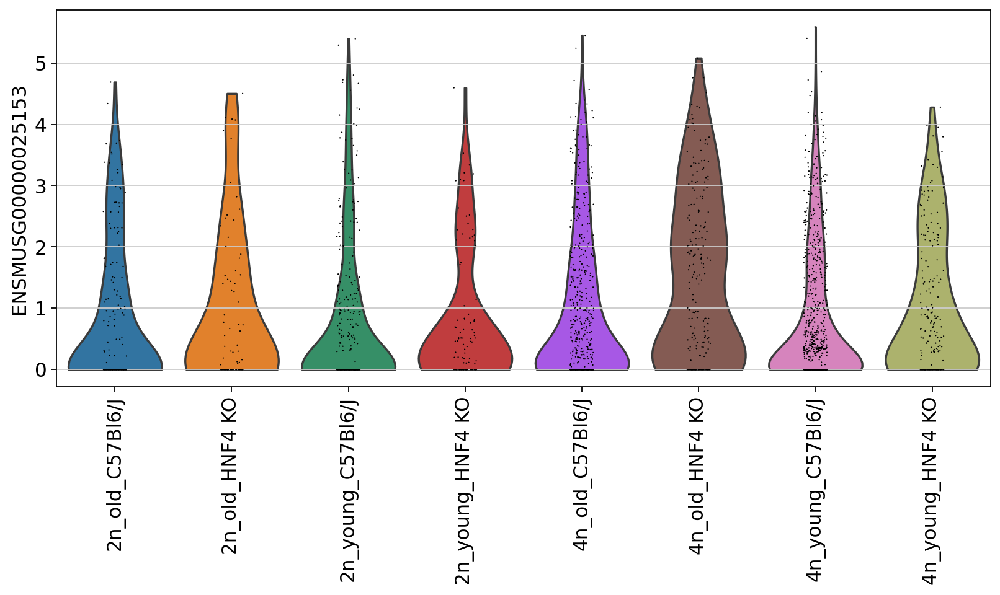

/home/icb/maren.buettner/anaconda3/envs/scanpy1-6/lib/python3.8/site-packages/anndata/_core/anndata.py:1207: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'exp.' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'age' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'sex' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'row' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'age_grouped' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'cyclone_phases' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'leiden_r1' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'leidenr02_02' as categorical
/home/icb/maren.buettner/anaconda3/envs/scanpy1-6/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass 

/home/icb/maren.buettner/anaconda3/envs/scanpy1-6/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


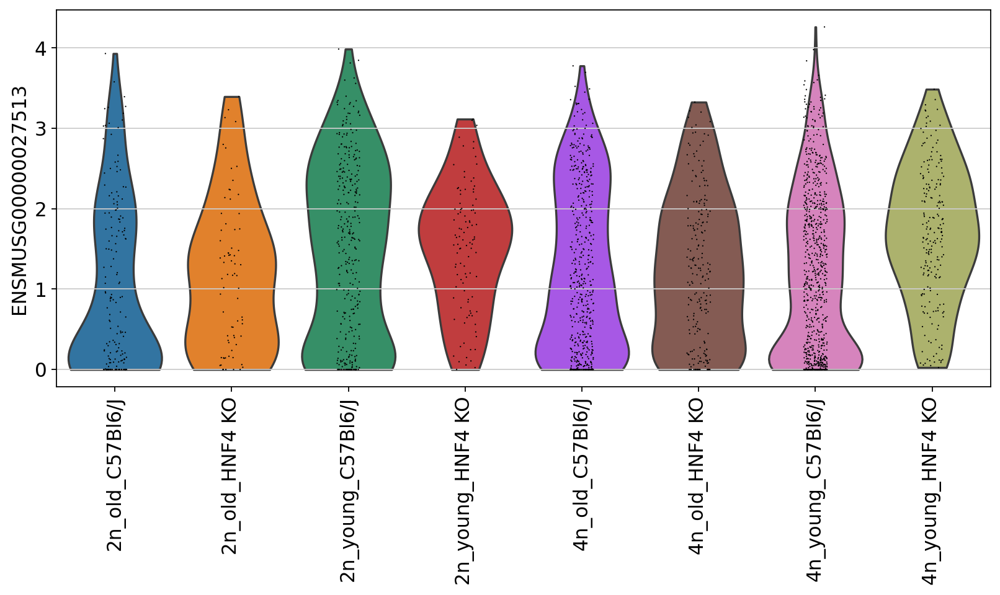

/home/icb/maren.buettner/anaconda3/envs/scanpy1-6/lib/python3.8/site-packages/anndata/_core/anndata.py:1207: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'exp.' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'age' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'sex' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'row' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'age_grouped' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'cyclone_phases' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'leiden_r1' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'leidenr02_02' as categorical


/home/icb/maren.buettner/anaconda3/envs/scanpy1-6/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/icb/maren.buettner/anaconda3/envs/scanpy1-6/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


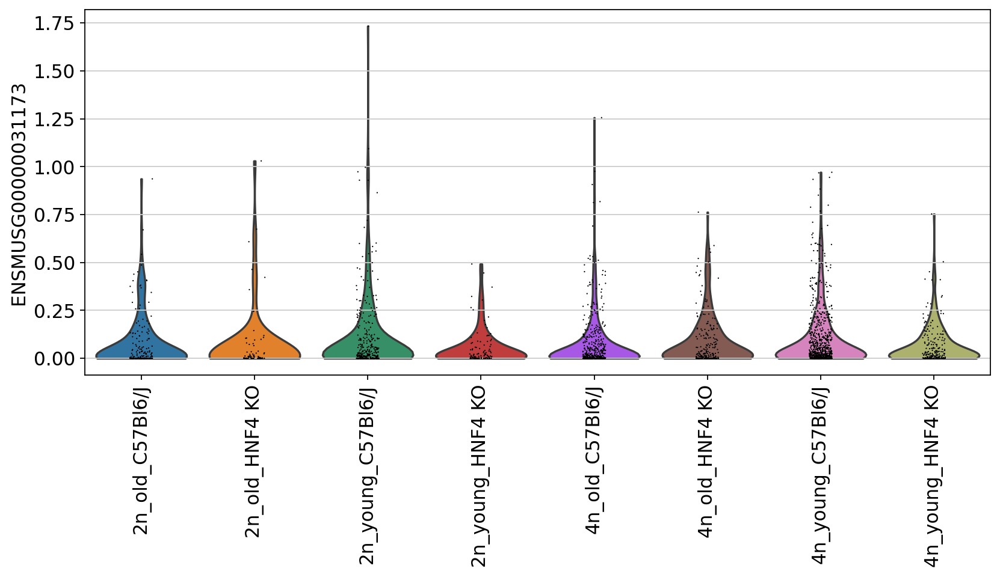

/home/icb/maren.buettner/anaconda3/envs/scanpy1-6/lib/python3.8/site-packages/anndata/_core/anndata.py:1207: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'exp.' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'age' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'sex' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'row' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'age_grouped' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'cyclone_phases' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'leiden_r1' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'leidenr02_02' as categorical


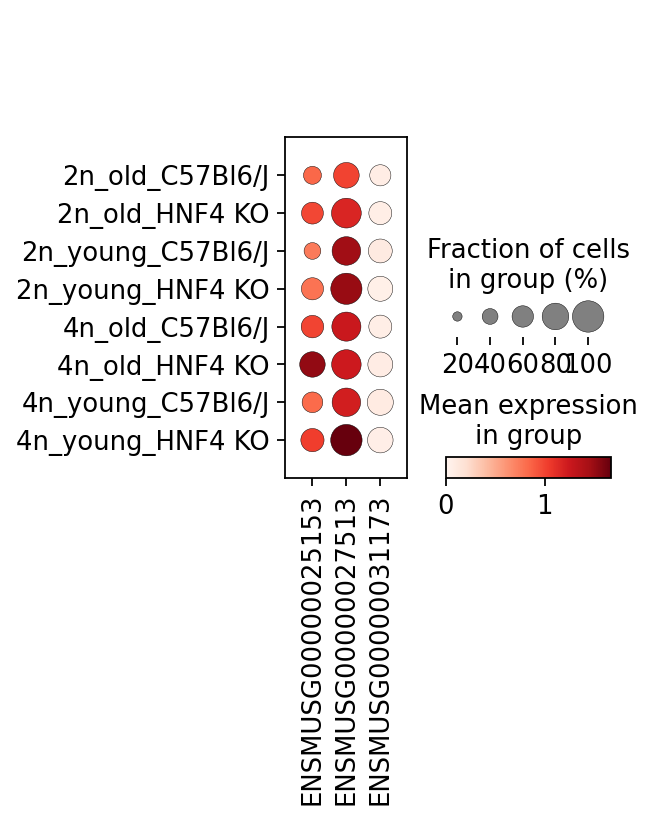

In [20]:
rcParams['figure.figsize']=(10,5)
for gene in enumerate(gene_oi):
    sc.pl.violin(adata[mask], groupby='ploidy_age_strain', rotation=90,
             keys=gene[1], save= gene_names_oi[gene[0]] + '_hnf4_ko.pdf')
sc.pl.dotplot(adata[mask], groupby='ploidy_age_strain', vmin=0,
             var_names=gene_oi, save = '_hnf4_ko.pdf')

In [29]:
mask2 = np.logical_and(np.in1d(adata.obs['cell_type'], ['2n Hepatocytes', '4n Hepatocytes']),
                      np.in1d(adata.obs['strain'], ['C57Bl6/J','CTCF KO']))

/home/icb/maren.buettner/anaconda3/envs/scanpy1-6/lib/python3.8/site-packages/anndata/_core/anndata.py:1207: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'exp.' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'age' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'sex' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'row' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'age_grouped' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'cyclone_phases' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'leiden_r1' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'leidenr02_02' as categorical


/home/icb/maren.buettner/anaconda3/envs/scanpy1-6/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/icb/maren.buettner/anaconda3/envs/scanpy1-6/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


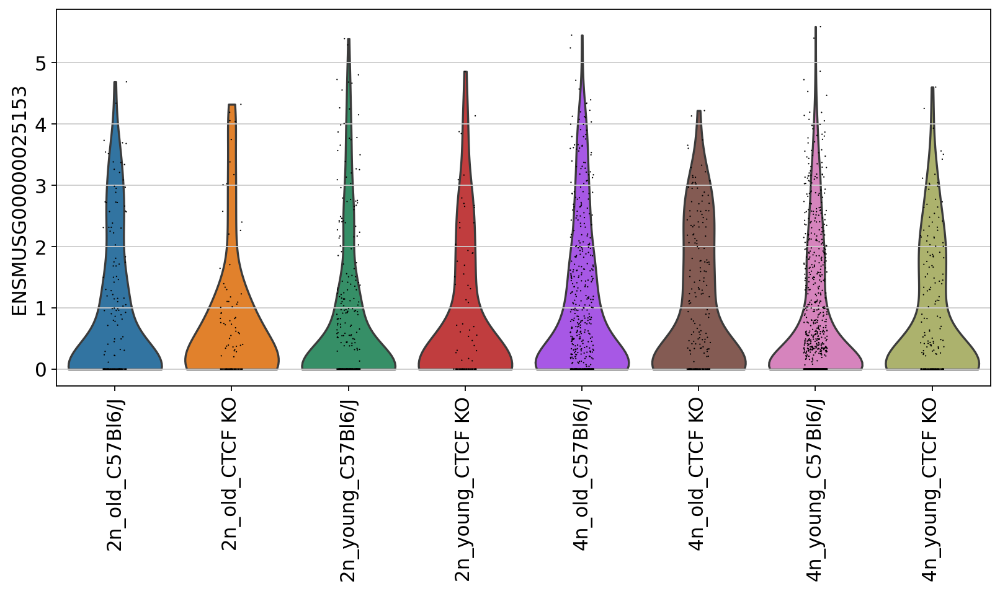

/home/icb/maren.buettner/anaconda3/envs/scanpy1-6/lib/python3.8/site-packages/anndata/_core/anndata.py:1207: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'exp.' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'age' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'sex' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'row' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'age_grouped' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'cyclone_phases' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'leiden_r1' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'leidenr02_02' as categorical


/home/icb/maren.buettner/anaconda3/envs/scanpy1-6/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/icb/maren.buettner/anaconda3/envs/scanpy1-6/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


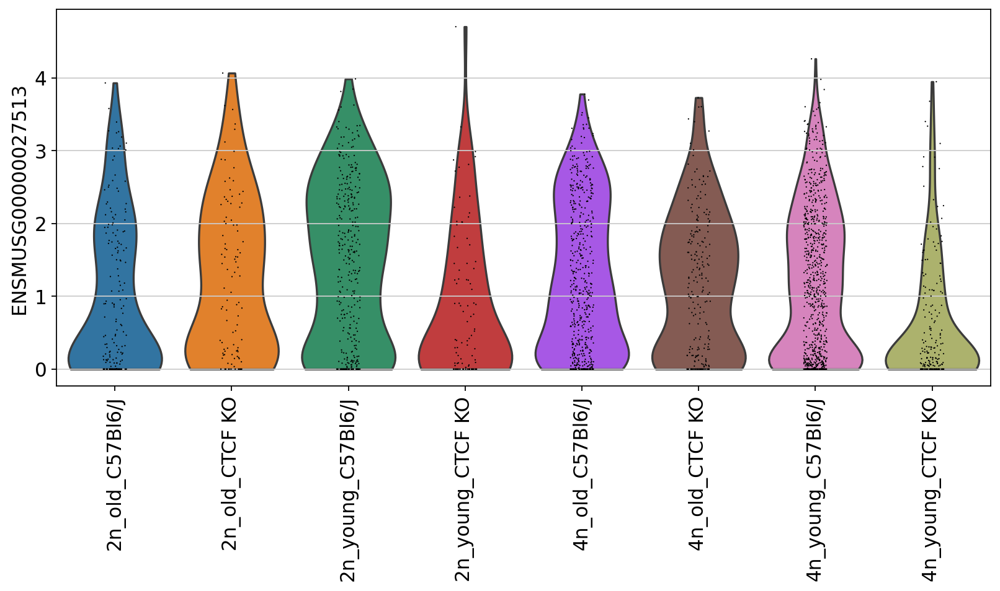

/home/icb/maren.buettner/anaconda3/envs/scanpy1-6/lib/python3.8/site-packages/anndata/_core/anndata.py:1207: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'exp.' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'age' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'sex' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'row' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'age_grouped' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'cyclone_phases' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'leiden_r1' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'leidenr02_02' as categorical


/home/icb/maren.buettner/anaconda3/envs/scanpy1-6/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/icb/maren.buettner/anaconda3/envs/scanpy1-6/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


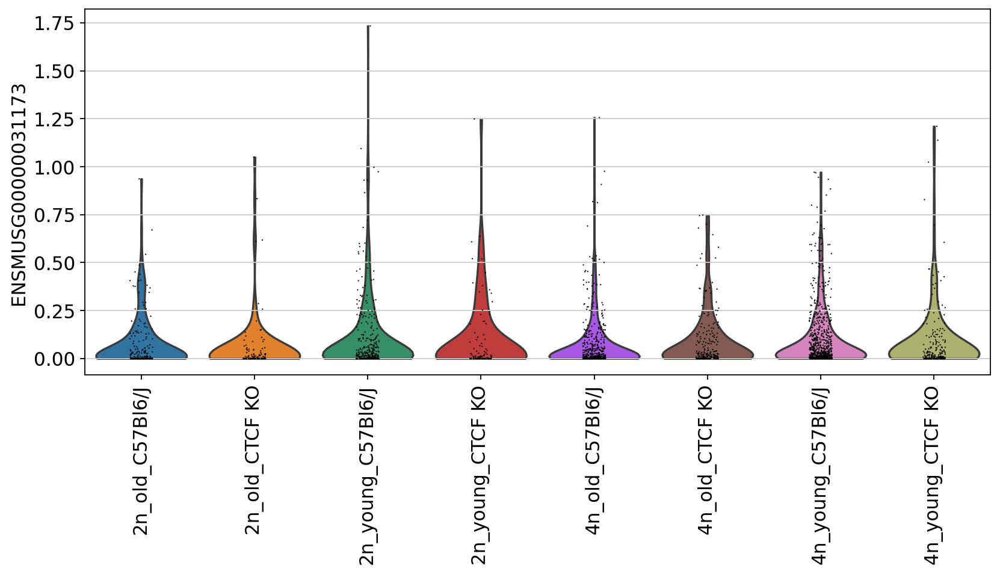

/home/icb/maren.buettner/anaconda3/envs/scanpy1-6/lib/python3.8/site-packages/anndata/_core/anndata.py:1207: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'exp.' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'age' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'sex' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'row' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'age_grouped' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'cyclone_phases' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'leiden_r1' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'leidenr02_02' as categorical


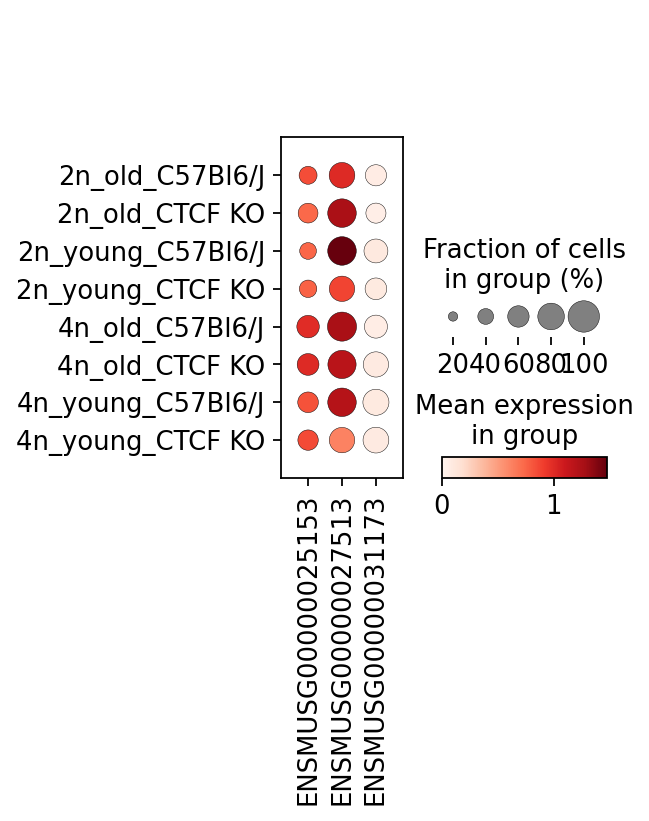

In [30]:
rcParams['figure.figsize']=(10,5)
for gene in enumerate(gene_oi):
    sc.pl.violin(adata[mask2], groupby='ploidy_age_strain', rotation=90,
             keys=gene[1], save= gene_names_oi[gene[0]] + '_ctcf_ko.pdf')
sc.pl.dotplot(adata[mask2], groupby='ploidy_age_strain', vmin=0,
             var_names=gene_oi, save = '_ctcf_ko.pdf')

In [31]:
mask2a = np.logical_and(np.in1d(adata.obs['cell_type'], ['2n Hepatocytes', '4n Hepatocytes']),
                      np.in1d(adata.obs['strain'], ['C57Bl6/J','CEBPA KO']))

/home/icb/maren.buettner/anaconda3/envs/scanpy1-6/lib/python3.8/site-packages/anndata/_core/anndata.py:1207: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'exp.' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'age' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'sex' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'row' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'age_grouped' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'cyclone_phases' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'leiden_r1' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'leidenr02_02' as categorical


/home/icb/maren.buettner/anaconda3/envs/scanpy1-6/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/icb/maren.buettner/anaconda3/envs/scanpy1-6/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


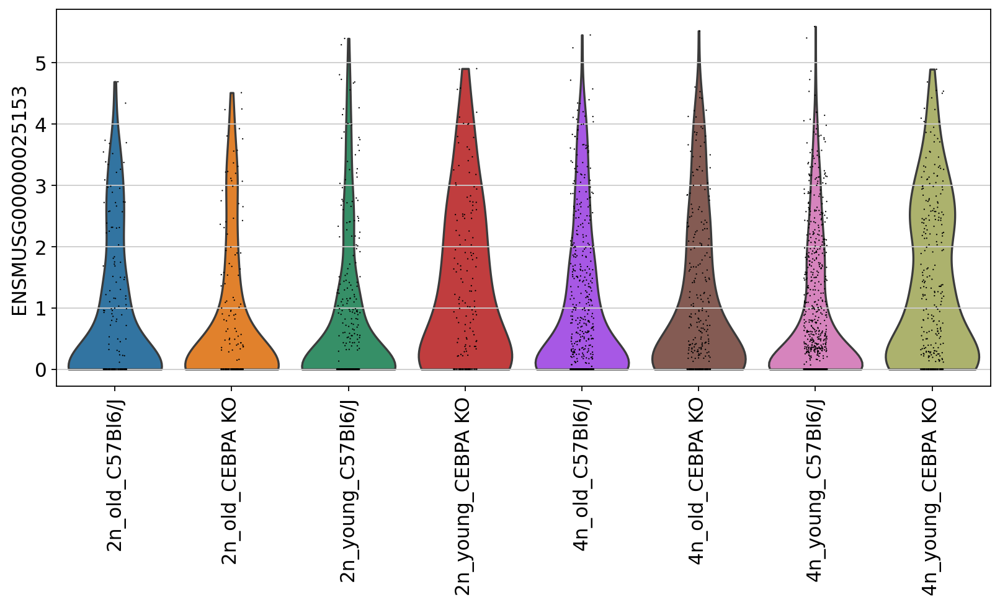

/home/icb/maren.buettner/anaconda3/envs/scanpy1-6/lib/python3.8/site-packages/anndata/_core/anndata.py:1207: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'exp.' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'age' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'sex' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'row' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'age_grouped' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'cyclone_phases' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'leiden_r1' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'leidenr02_02' as categorical


/home/icb/maren.buettner/anaconda3/envs/scanpy1-6/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/icb/maren.buettner/anaconda3/envs/scanpy1-6/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


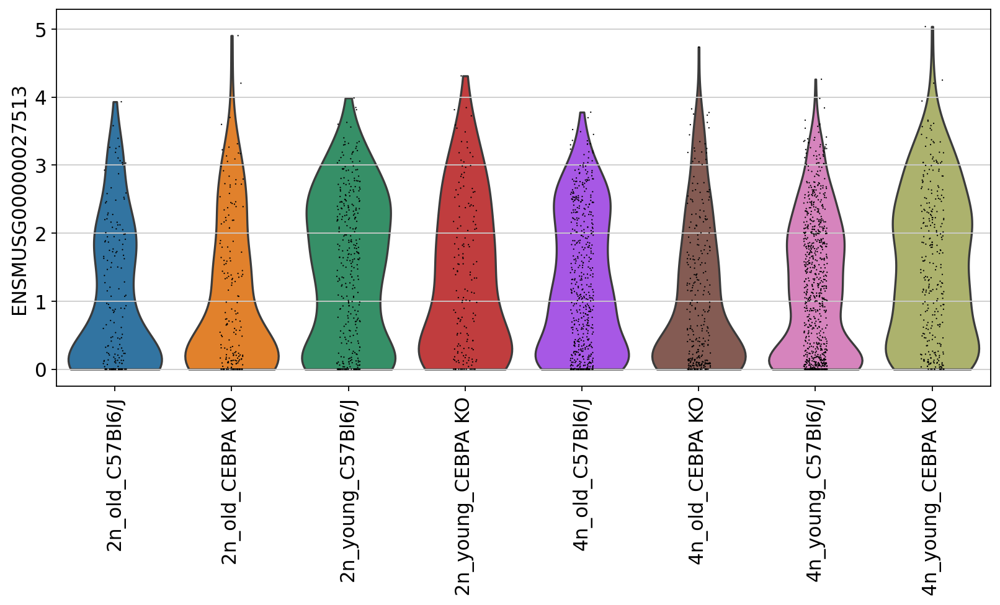

/home/icb/maren.buettner/anaconda3/envs/scanpy1-6/lib/python3.8/site-packages/anndata/_core/anndata.py:1207: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'exp.' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'age' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'sex' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'row' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'age_grouped' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'cyclone_phases' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'leiden_r1' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'leidenr02_02' as categorical


/home/icb/maren.buettner/anaconda3/envs/scanpy1-6/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/home/icb/maren.buettner/anaconda3/envs/scanpy1-6/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


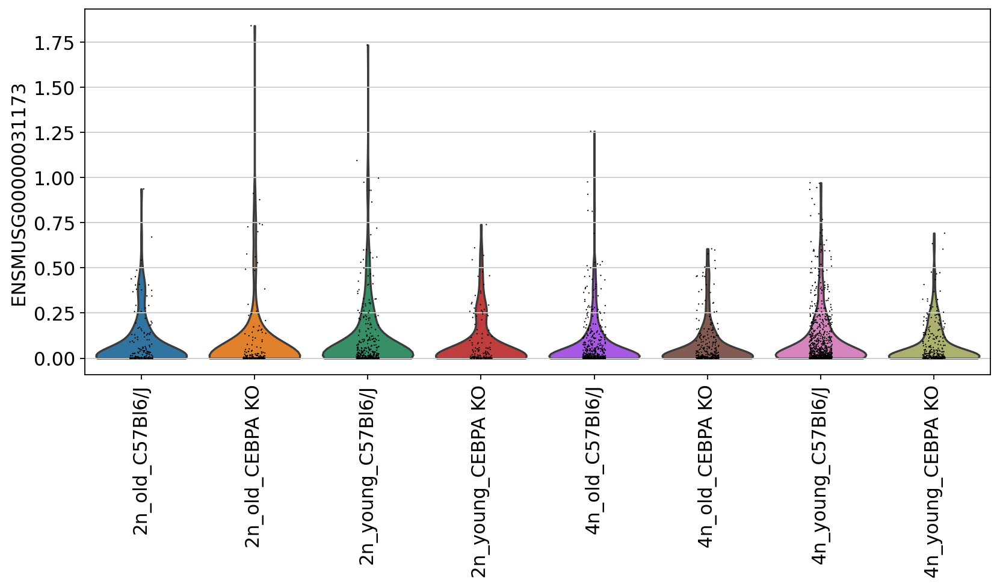

/home/icb/maren.buettner/anaconda3/envs/scanpy1-6/lib/python3.8/site-packages/anndata/_core/anndata.py:1207: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'exp.' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'age' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'sex' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'row' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'age_grouped' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'cyclone_phases' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'leiden_r1' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'leidenr02_02' as categorical


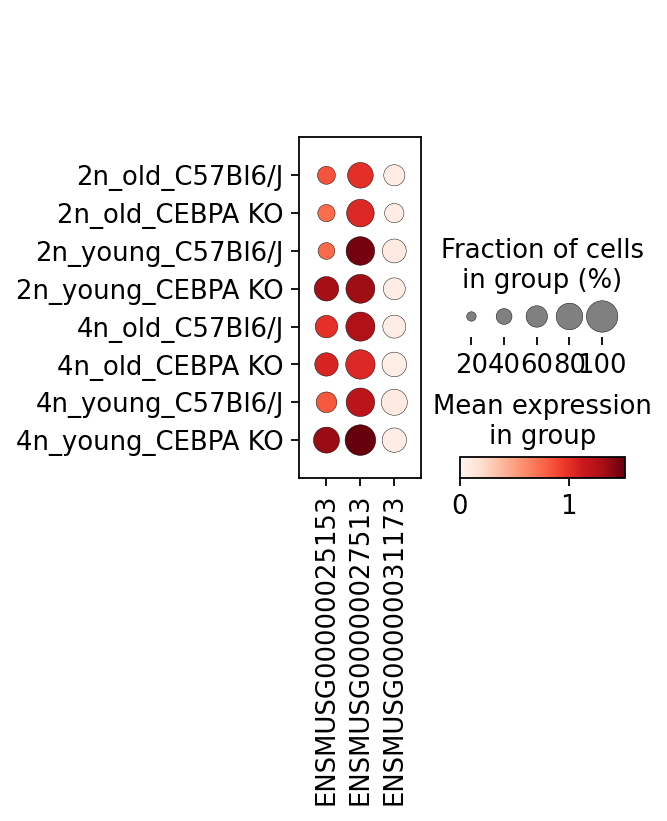

In [32]:
rcParams['figure.figsize']=(10,5)
for gene in enumerate(gene_oi):
    sc.pl.violin(adata[mask2a], groupby='ploidy_age_strain', rotation=90,
             keys=gene[1], save= gene_names_oi[gene[0]] + '_cebpa_ko.pdf')
sc.pl.dotplot(adata[mask2a], groupby='ploidy_age_strain', vmin=0,
             var_names=gene_oi, save = '_cebpa_ko.pdf')

## Correlation plots

Plot correlation of age, strain and ploidy in hepatocytes.

In [21]:
mask3 = np.in1d(adata.obs['cell_type'], ['2n Hepatocytes', '4n Hepatocytes'])
                      

In [22]:
adata_tmp = adata[mask3].copy()

In [25]:
sc.tl.dendrogram(adata_tmp, groupby='ploidy_age_strain')
p = sc.pl.correlation_matrix(adata_tmp, groupby="ploidy_age_strain", vmin=0, show=False,
                         save = today +'_correlation_age_strain_ploidy.pdf')
#plt.savefig('./figures/correlation_age_strain_ploidy.pdf', bbox_inches='tight')
#plt.show()

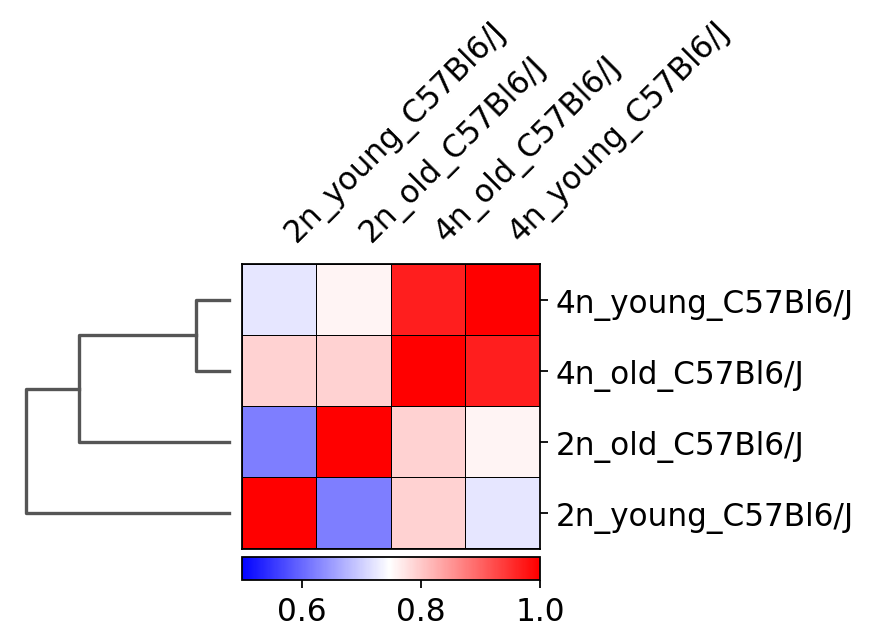

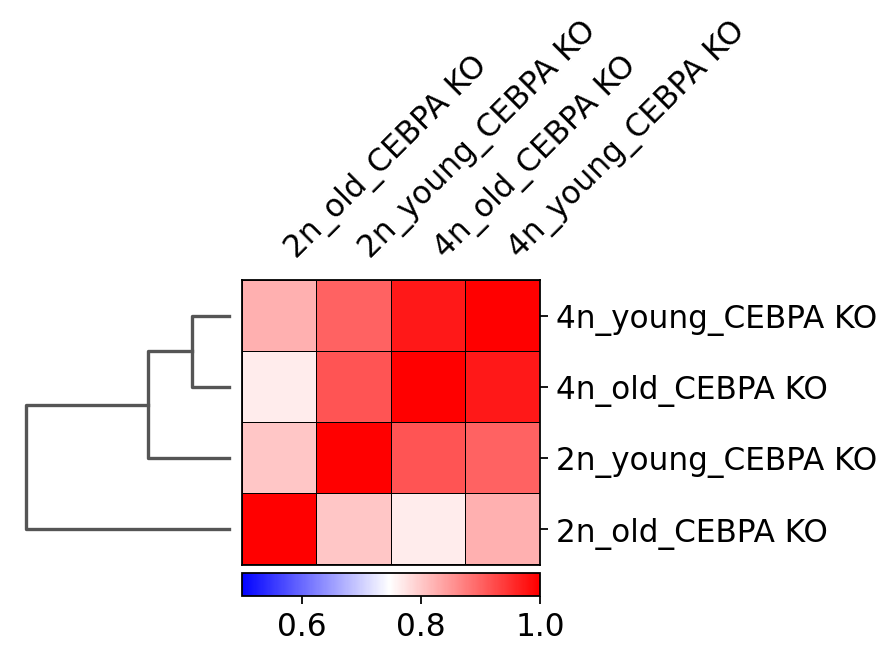

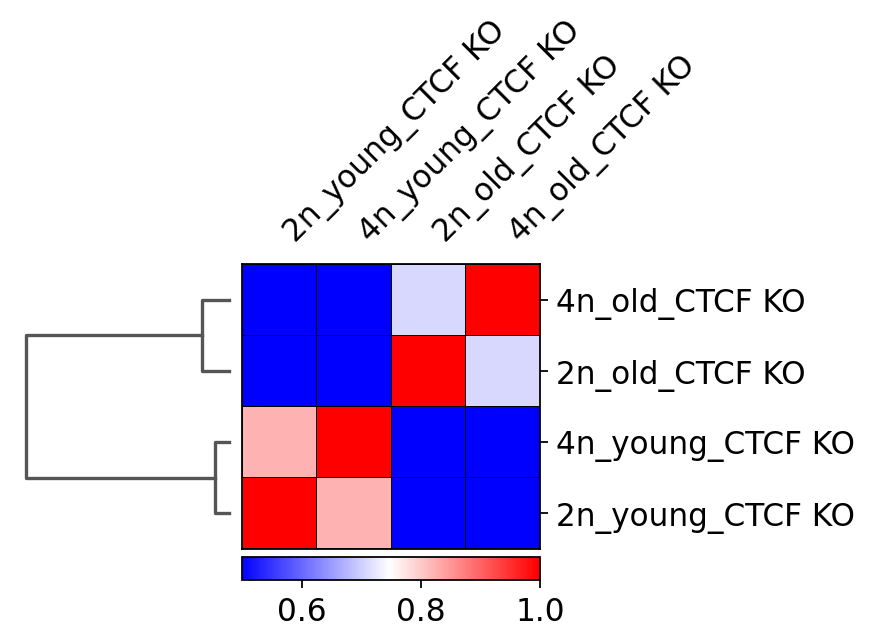

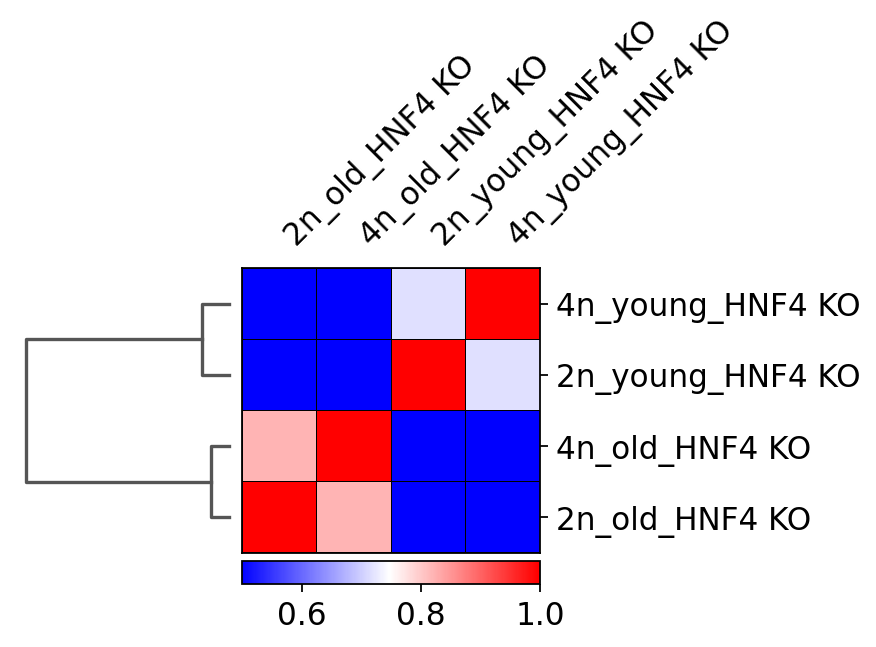

In [26]:
strains = adata.obs['strain'].cat.categories

for strain in strains:
    mask4 = np.logical_and(np.in1d(adata.obs['cell_type'], ['2n Hepatocytes', '4n Hepatocytes']),
                       np.in1d(adata.obs['strain'], [strain]))
           
    adata_tmp = adata[mask4].copy()
    sc.tl.dendrogram(adata_tmp, groupby='ploidy_age_strain')
    p = sc.pl.correlation_matrix(adata_tmp, groupby="ploidy_age_strain", 
                             vmin=0.5, show=False)
    plt.savefig('./figures/correlation_'+ strain.replace('/', '') +'.pdf', bbox_inches='tight')
    plt.show()

Visualise marker genes as stacked violin plots.

... storing 'exp.' as categorical
... storing 'age' as categorical
... storing 'sex' as categorical
... storing 'row' as categorical
... storing 'age_grouped' as categorical
... storing 'cyclone_phases' as categorical
... storing 'leiden_r1' as categorical
... storing 'leidenr02_02' as categorical


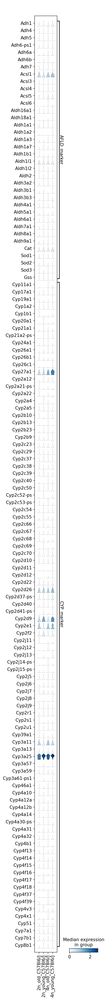

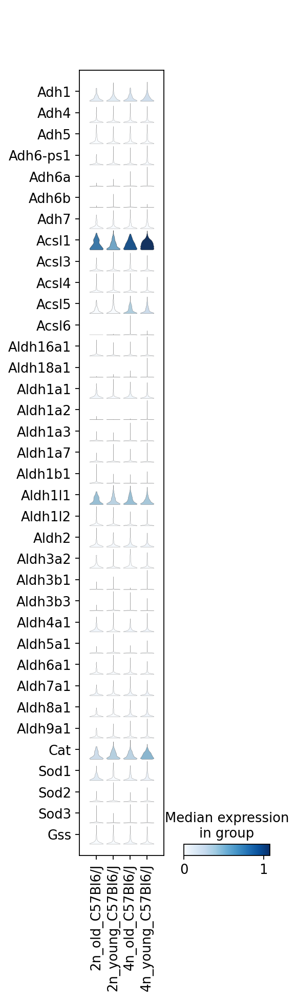

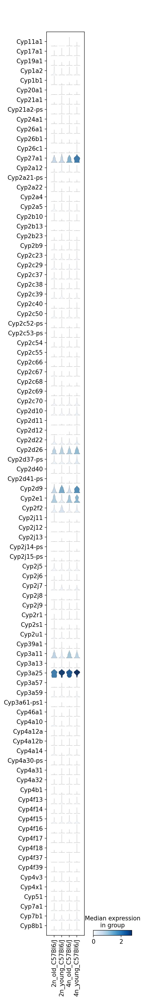

... storing 'exp.' as categorical
... storing 'age' as categorical
... storing 'sex' as categorical
... storing 'row' as categorical
... storing 'age_grouped' as categorical
... storing 'cyclone_phases' as categorical
... storing 'leiden_r1' as categorical
... storing 'leidenr02_02' as categorical


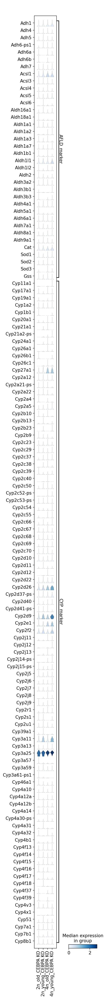

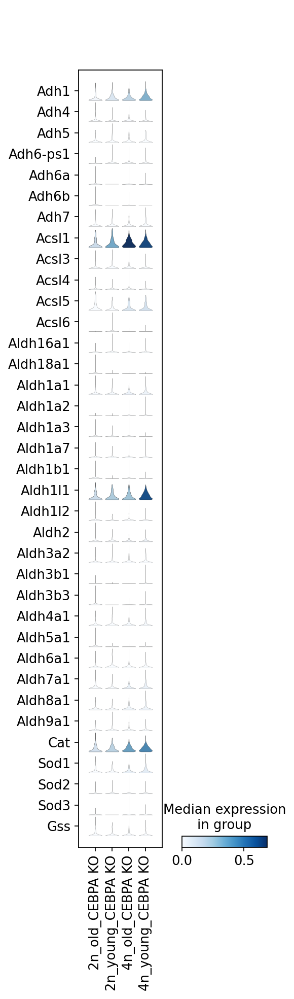

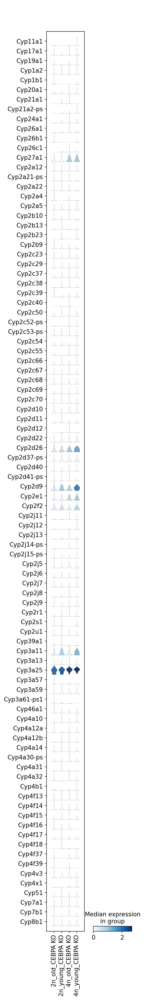

... storing 'exp.' as categorical
... storing 'age' as categorical
... storing 'sex' as categorical
... storing 'row' as categorical
... storing 'age_grouped' as categorical
... storing 'cyclone_phases' as categorical
... storing 'leiden_r1' as categorical
... storing 'leidenr02_02' as categorical


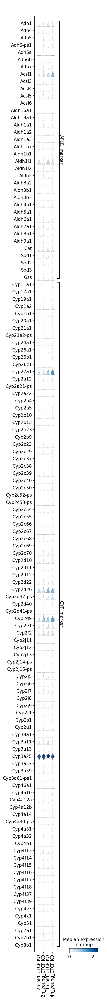

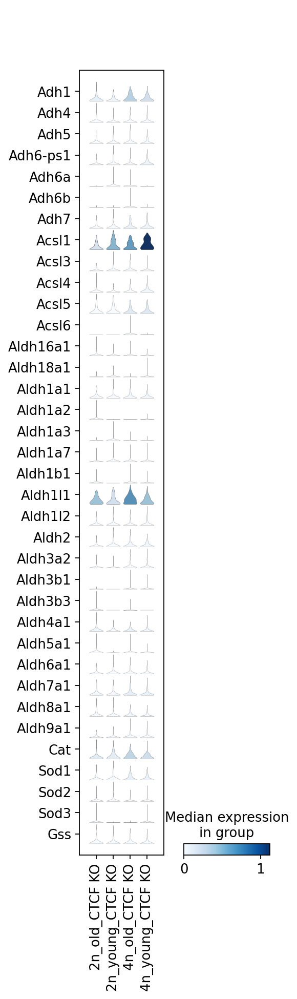

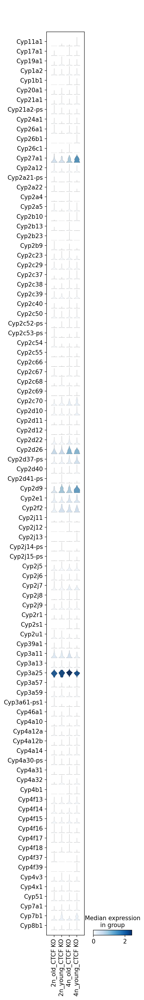

... storing 'exp.' as categorical
... storing 'age' as categorical
... storing 'sex' as categorical
... storing 'row' as categorical
... storing 'age_grouped' as categorical
... storing 'cyclone_phases' as categorical
... storing 'leiden_r1' as categorical
... storing 'leidenr02_02' as categorical


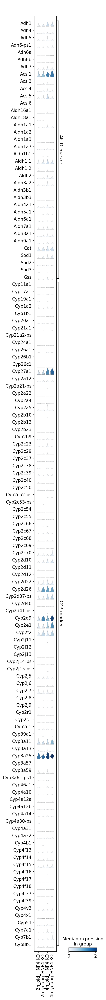

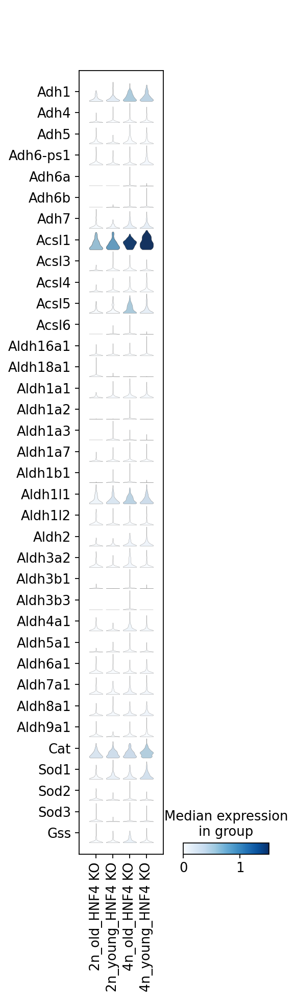

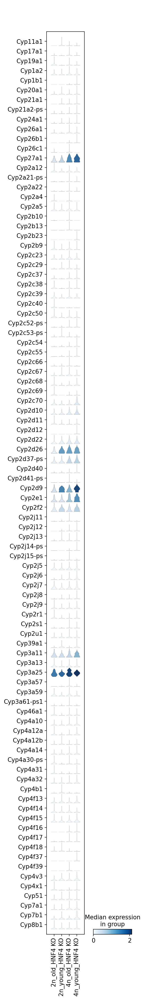

In [26]:
strains = adata.obs['strain'].cat.categories

for strain in strains:
    mask4 = np.logical_and(np.in1d(adata.obs['cell_type'], ['2n Hepatocytes', '4n Hepatocytes']),
                       np.in1d(adata.obs['strain'], [strain]))
           
    adata_tmp = adata[mask4].copy()
   
    sc.pl.stacked_violin(adata_tmp, gene_symbols="gene_name", 
                         groupby="ploidy_age_strain", swap_axes=True, 
                     var_names=gene_dict, save= '_' + strain.replace('/', '') + '_markers_cell_type.pdf')
    for key in gene_dict.keys():
        sc.pl.stacked_violin(adata_tmp, gene_symbols="gene_name", 
                             groupby="ploidy_age_strain", swap_axes=True, 
                     var_names=gene_dict[key], save= '_' + strain.replace('/', '') + '_' + key + '_markers_cell_type.pdf')
    

In [27]:
strains = adata.obs['strain'].cat.categories

for strain in strains:
    mask4 = np.logical_and(np.in1d(adata.obs['cell_type'], ['2n Hepatocytes', '4n Hepatocytes']),
                       np.in1d(adata.obs['strain'], [strain]))
           
    adata_tmp = adata[mask4].copy()
    sc.pl.stacked_violin(adata_tmp, gene_symbols="gene_name", 
                         groupby="ploidy_age_strain", swap_axes=True, show=False,
                     var_names=cell_type_name_dict,
                         save= '_' + strain.replace('/', '') + '_all_markers_cell_type.pdf')
    for key in cell_type_name_dict.keys():
        sc.pl.stacked_violin(adata_tmp, gene_symbols="gene_name", 
                             groupby="ploidy_age_strain", swap_axes=True,  show=False,
                     var_names=cell_type_name_dict[key],
                             save= '_' + strain.replace('/', '') + '_' + key + '_markers_cell_type.pdf')
    

... storing 'exp.' as categorical
... storing 'age' as categorical
... storing 'sex' as categorical
... storing 'row' as categorical
... storing 'age_grouped' as categorical
... storing 'cyclone_phases' as categorical
... storing 'leiden_r1' as categorical
... storing 'leidenr02_02' as categorical


... storing 'exp.' as categorical
... storing 'age' as categorical
... storing 'sex' as categorical
... storing 'row' as categorical
... storing 'age_grouped' as categorical
... storing 'cyclone_phases' as categorical
... storing 'leiden_r1' as categorical
... storing 'leidenr02_02' as categorical


... storing 'exp.' as categorical
... storing 'age' as categorical
... storing 'sex' as categorical
... storing 'row' as categorical
... storing 'age_grouped' as categorical
... storing 'cyclone_phases' as categorical
... storing 'leiden_r1' as categorical
... storing 'leidenr02_02' as categorical


... storing 'exp.' as categorical
... storing 'age' as categorical
... storing 'sex' as categorical
... storing 'row' as categorical
... storing 'age_grouped' as categorical
... storing 'cyclone_phases' as categorical
... storing 'leiden_r1' as categorical
... storing 'leidenr02_02' as categorical


# DE test in all data

We do a differential expression test for all cells and focus on hepatocytes specifically. In a second step, we test the differen strains for differences (young and old separately).

## Differential expression between cell types

In [18]:
marker_names_all = []
cell_type_list = []
with open(table_dir + "cell_type_markers_curated.csv") as f:
    head = f.readline()
    for line in f:
        line = line.split("\t")
        marker_names_all.append(line[0])
        cell_type_list.append(line[2][:-1])      
cell_type_dict = {}
for name in list(set(cell_type_list)):
    cell_type_dict[name] = []
for i in range(0, len(cell_type_list)):
    cell_type_dict[cell_type_list[i]].append(marker_names_all[i])
gene_name_dict = {}
for i in range(0, len(adata.var)):
    gene_name_dict[adata.var["gene_name"][i]] = adata.var_names[i]
cell_type_id_dict = {}
for name in list(set(cell_type_list)):
    cell_type_id_dict[name] = []
cell_type_name_dict = {}
for name in list(set(cell_type_list)):
    cell_type_name_dict[name] = []
for name in list(set(cell_type_list)):
    item = cell_type_dict[name]
    for elem in item:
        if elem in gene_name_dict.keys():
            cell_type_id_dict[name].append(gene_name_dict[elem])
            cell_type_name_dict[name].append(elem) 

In [28]:
sc.tl.rank_genes_groups(adata, groupby="cell_type1", n_genes=500)

... storing 'exp.' as categorical
... storing 'age' as categorical
... storing 'sex' as categorical
... storing 'row' as categorical
... storing 'age_grouped' as categorical
... storing 'cyclone_phases' as categorical
... storing 'leiden_r1' as categorical
... storing 'leidenr02_02' as categorical


In [29]:
df = sc.tl.marker_gene_overlap(adata, reference_markers=cell_type_id_dict)

In [30]:
df

,Hepatocytes,Hepatobiliary cells,Endothelial cells,Kupffer and Dendritic cells,Lymphocytes,Stellate cells
Endothelial cell,1.0,12.0,19.0,0.0,0.0,20.0
Hepatobiliary,7.0,7.0,2.0,7.0,0.0,1.0
Dendritic cell,0.0,11.0,0.0,14.0,0.0,0.0
Kupffer cell,1.0,18.0,3.0,38.0,0.0,1.0
Neutrophil,1.0,1.0,0.0,1.0,0.0,0.0
Hepatocyte,69.0,4.0,1.0,2.0,1.0,4.0
Lymphocyte,1.0,26.0,2.0,4.0,4.0,1.0


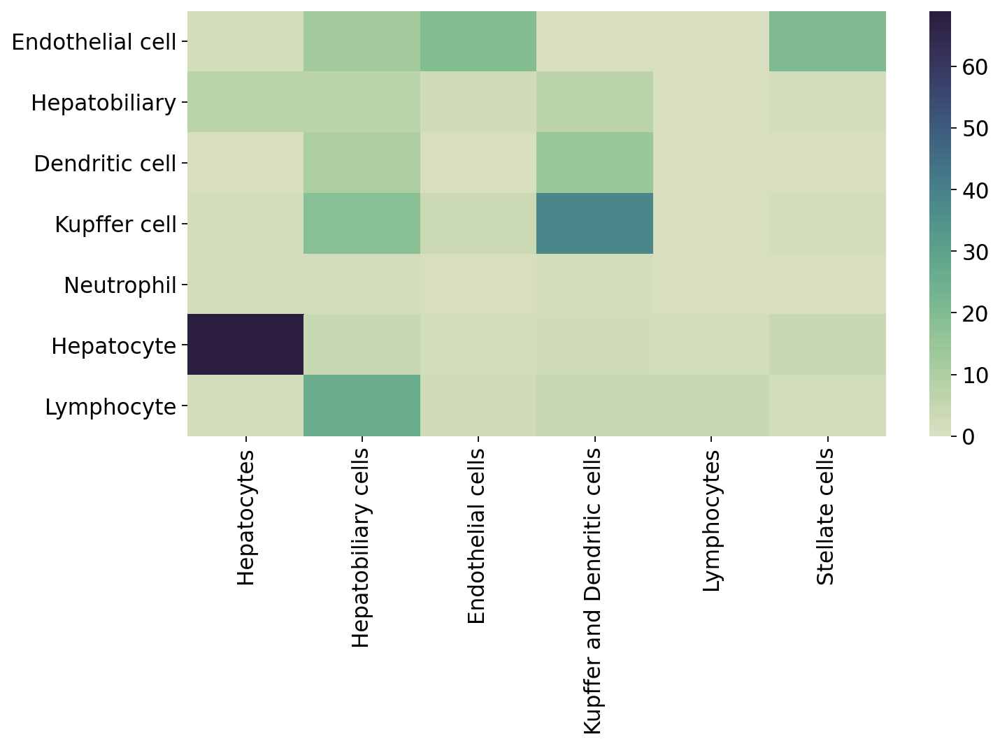

In [31]:
sns.heatmap(df, cmap=sns.cubehelix_palette(69, start=.5, rot=-.75))
#plt.gcf().subplots_adjust(bottom=0.5)
#plt.gcf().subplots_adjust(left=0.5)
plt.savefig("./figures/" + today + "_heatmap_markers_de_genes.pdf")

In [32]:
sc.tl.rank_genes_groups(adata, groupby="cell_type1", n_genes=adata.n_vars)

In [33]:
dict_genes = adata.uns["rank_genes_groups"].copy()

In [34]:
df = {}
for idx, elem in enumerate(list(dict_genes["names"].dtype.names)):
    print(idx, elem)
    df[elem+"_gene"] = []
    df[elem+"_logfoldchange"] = []
    df[elem+"_pval_adj"] = []
    for j in range(0, len(adata.var)):
        df[elem+"_gene"].append(dict_genes["names"][j][idx])
        df[elem+"_logfoldchange"].append(dict_genes["logfoldchanges"][j][idx])
        df[elem+"_pval_adj"].append(dict_genes["pvals_adj"][j][idx])

dataframe = pd.DataFrame(df)        
for idx, elem in enumerate(list(dict_genes["names"].dtype.names)):
    adata.var[elem+"_mean"] = np.mean(adata[adata.obs["cell_type1"] == elem,:].layers["norm_counts"], axis=0)
    adata.var[elem+"_n_cells"] = np.sum(adata[adata.obs["cell_type1"] == elem,:].layers["norm_counts"] > 0, axis=0)
    dataframe.index = dataframe[elem+"_gene"]
    adata.var[elem+"_log2FC"] = dataframe[elem+"_logfoldchange"]
    adata.var[elem+"_pvals_adj"] = dataframe[elem+"_pval_adj"]

0 Hepatocytes
1 Hepatobiliary cells
2 Endothelial cells
3 Kupffer and Dendritic cells
4 Lymphocytes
5 Stellate cells


In [35]:
adata.var

,gene_name,length,Hepatocytes_mean,Hepatocytes_n_cells,Hepatocytes_log2FC,Hepatocytes_pvals_adj,Hepatobiliary cells_mean,Hepatobiliary cells_n_cells,Hepatobiliary cells_log2FC,Hepatobiliary cells_pvals_adj,...,Kupffer and Dendritic cells_log2FC,Kupffer and Dendritic cells_pvals_adj,Lymphocytes_mean,Lymphocytes_n_cells,Lymphocytes_log2FC,Lymphocytes_pvals_adj,Stellate cells_mean,Stellate cells_n_cells,Stellate cells_log2FC,Stellate cells_pvals_adj
ENSMUSG00000000001,Gnai3,38866,0.054192,1592,-0.522948,1.756441e-04,0.075239,104,-0.521160,2.193877e-01,...,0.572404,1.833144e-01,0.110940,524,0.511075,8.032410e-03,0.065328,75,-0.049464,9.237791e-01
ENSMUSG00000000028,Cdc45,1483,0.085764,155,-0.794718,1.918470e-02,0.025699,12,-0.777365,1.070365e-01,...,0.255485,8.065295e-01,0.474529,76,1.295874,5.712765e-03,0.020515,8,-0.899865,8.584344e-02
ENSMUSG00000000037,Scml2,5291,0.007287,139,-0.095065,8.863498e-01,0.001540,3,-1.685324,1.308983e-02,...,0.030283,9.747452e-01,0.004131,25,-0.453549,4.653300e-01,0.063271,7,1.941923,5.203434e-01
ENSMUSG00000000049,Apoh,19103,0.278469,2770,1.270284,6.064009e-49,0.271423,193,0.159846,5.049666e-01,...,-0.988982,9.036147e-07,0.116330,419,-1.586377,4.477974e-39,0.071186,80,-1.506599,8.713321e-15
ENSMUSG00000000056,Narf,791,1.348746,824,1.660974,6.077668e-36,0.183827,31,-1.490347,4.042590e-11,...,-1.571140,3.749743e-10,0.529667,102,-1.257842,5.860883e-15,1.414253,17,-0.787615,9.826074e-02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSMUSG00000116987,AC150035.3,29510,0.002755,133,-0.304246,6.075092e-01,0.001323,10,-1.092332,5.867786e-02,...,0.239047,9.119466e-01,0.006483,41,1.125007,1.700203e-01,0.000280,3,-3.296950,1.968861e-07
ENSMUSG00000116988,AC164314.2,65093,0.003480,506,0.309665,3.796298e-01,0.001679,27,-0.935185,2.570797e-02,...,0.309095,7.032116e-01,0.003319,76,-0.278438,6.724102e-01,0.006110,20,0.932277,3.261467e-01
ENSMUSG00000116992,AC183097.4,42514,0.045871,813,-0.430688,1.158603e-02,0.007366,36,-2.704175,8.873739e-25,...,-0.426611,3.176256e-01,0.098855,302,0.957755,1.180133e-05,0.048202,29,-0.508976,4.767409e-01
ENSMUSG00000116993,AC135964.2,36081,0.028029,1024,3.119190,3.275295e-41,0.012101,33,-1.022335,9.462279e-02,...,-3.544951,5.185577e-42,0.001544,73,-3.611889,9.007256e-50,0.003420,8,-2.391473,8.571472e-08


## Differential expression between 2n and 4n hepatocytes

Here, we test the gene expression between 2n and 4n hepatocytes over all ages and strains. 

In [19]:
adata1 = adata[adata.obs["cell_type1"] == "Hepatocytes",:].copy()

In [75]:
sc.tl.rank_genes_groups(adata1, groupby="cell_type", n_genes=adata1.n_vars, method="t-test")

... storing 'changes_hep' as categorical


In [76]:
dict_genes = adata1.uns["rank_genes_groups"].copy()

In [77]:
df = {}
for idx, elem in enumerate(list(dict_genes["names"].dtype.names)):
    print(idx, elem)
    df[elem+"_gene"] = []
    df[elem+"_logfoldchange"] = []
    df[elem+"_pval_adj"] = []
    for j in range(0, len(adata.var)):
        df[elem+"_gene"].append(dict_genes["names"][j][idx])
        df[elem+"_logfoldchange"].append(dict_genes["logfoldchanges"][j][idx])
        df[elem+"_pval_adj"].append(dict_genes["pvals_adj"][j][idx])

dataframe = pd.DataFrame(df)        
for idx, elem in enumerate(list(dict_genes["names"].dtype.names)):
    adata1.var[elem+"_mean"] = np.mean(adata1[adata1.obs["cell_type"] == elem,:].layers["norm_counts"], axis=0)
    #adata.var[elem+"_sum"] = np.sum(adata[adata.obs["cell_type"] == elem,:].layers["norm_counts"], axis=0)
    adata1.var[elem+"_n_cells"] = np.sum(adata1[adata1.obs["cell_type"] == elem,:].layers["norm_counts"] > 0, axis=0)
    dataframe.index = dataframe[elem+"_gene"]
    adata1.var[elem+"_log2FC"] = dataframe[elem+"_logfoldchange"]
    adata1.var[elem+"_pvals_adj"] = dataframe[elem+"_pval_adj"]

0 2n Hepatocytes
1 4n Hepatocytes


In [78]:
changes = []
for j in range(0, len(adata1.var)):
    if adata1.var["2n Hepatocytes_log2FC"][j] > 0.5 and adata1.var["2n Hepatocytes_pvals_adj"][j] < 0.05:
        changes.append("up_2n")
    elif adata1.var["4n Hepatocytes_log2FC"][j] > 0.5 and adata1.var["4n Hepatocytes_pvals_adj"][j] < 0.05:
        changes.append("up_4n")
    else:
        changes.append("none")
        
adata1.var["changes_hep"] = changes        

In [47]:
#adata.var.to_csv(table_dir + today + "_gene_expression_cell_types_and_ploidy_filter25.csv")

In [79]:
df = pd.DataFrame()
df["mean_2n"] = adata1.var["2n Hepatocytes_mean"]
df["mean_4n"] = adata1.var["4n Hepatocytes_mean"]
df["cells_2n"] = adata1.var["2n Hepatocytes_n_cells"]
df["cells_4n"] = adata1.var["4n Hepatocytes_n_cells"]
df["changes"] = adata1.var["changes_hep"]
df.index = adata1.var.index

In [80]:
df1 = df[df["mean_2n"] > 0.1]
df1 = df1[df1["mean_2n"] < 100]
df2 = df1[df1["mean_4n"] > 0.1]
df2 = df2[df2["mean_2n"] < 100]

In [95]:
cols = []
for elem in df2["changes"]:
    if elem == "up_2n":
        cols.append("#1f77b4")
    elif elem == "up_4n":
        cols.append("#ff7f0e")
    else:
        cols.append("0.75")

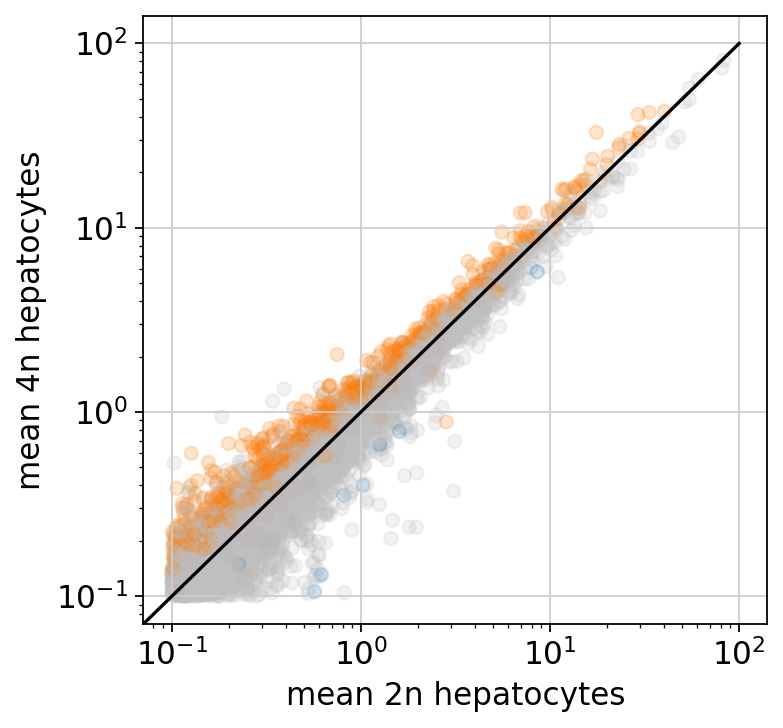

In [96]:
rcParams['figure.figsize']=(5,5)
fig = plt.scatter(x=df2["mean_2n"], y=df2["mean_4n"], c=cols, alpha=0.2)
plt.xscale("log")
plt.yscale("log")
ident = [0.0, 100]
plt.plot(ident,ident, color="k")
plt.xlabel('mean 2n hepatocytes')
plt.ylabel('mean 4n hepatocytes')
plt.savefig("./figures/"+today +"_mean_4n_vs_mean_2n_DE_filter25.pdf")

In [97]:
cols = []
for elem in adata.var["changes_hep"]:
    if elem == "up_2n":
        cols.append("#1f77b4") #blue
    elif elem == "up_4n":
        cols.append("#ff7f0e") #orange
    else:
        cols.append("0.75")

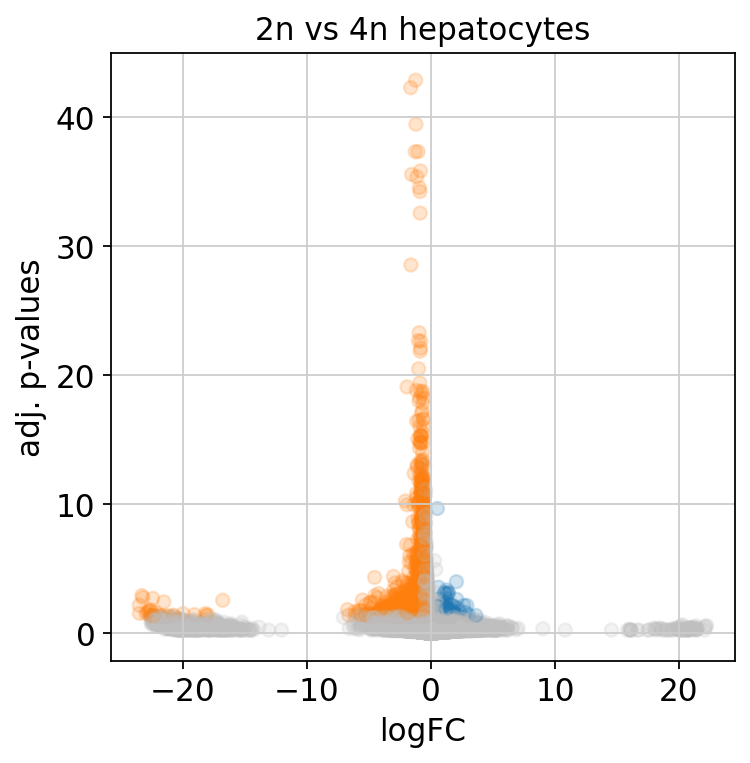

In [99]:
plt.scatter(y=-np.log10(adata1.var["2n Hepatocytes_pvals_adj"]), x=adata1.var["2n Hepatocytes_log2FC"],
                  c=cols,alpha=0.2)
plt.xlabel('logFC')
plt.ylabel('adj. p-values')
plt.title('2n vs 4n hepatocytes')
plt.show()

# DE test in young cells

Test 2n vs 4n hepatocytes (for all strains).

In [25]:
adata_young = adata[adata.obs['age_grouped']=='young'].copy()

In [26]:
cell_compo_table(adata_young, 'strain' , 'cell_type1')

strain,C57Bl6/J,CEBPA KO,CTCF KO,HNF4 KO,All
cell_type1,,,,,
Hepatocytes,1131,457,286,313,2187
Hepatobiliary cells,121,102,22,60,305
Endothelial cells,102,47,30,16,195
Kupffer and Dendritic cells,57,22,44,29,152
Lymphocytes,285,176,100,84,645
Stellate cells,37,24,13,16,90
All,1733,828,495,518,3574


In [27]:
cell_compo_table(adata_young, 'strain' , 'cell_type')

strain,C57Bl6/J,CEBPA KO,CTCF KO,HNF4 KO,All
cell_type,,,,,
2n Hepatocytes,336,162,92,102,692
4n Hepatocytes,795,295,194,211,1495
Hepatobiliary cells,121,102,22,60,305
Endothelial cells,102,47,30,16,195
Kupffer and Dendritic cells,57,22,44,29,152
Lymphocytes,285,176,100,84,645
Stellate cells,37,24,13,16,90
All,1733,828,495,518,3574


C57Bl6/J


... storing 'exp.' as categorical
... storing 'age' as categorical
... storing 'sex' as categorical
... storing 'row' as categorical
... storing 'age_grouped' as categorical
... storing 'cyclone_phases' as categorical
... storing 'leiden_r1' as categorical
... storing 'leidenr02_02' as categorical


0 Hepatocytes
1 Hepatobiliary cells
2 Endothelial cells
3 Kupffer and Dendritic cells
4 Lymphocytes
5 Stellate cells
0 2n Hepatocytes
1 4n Hepatocytes
none     7644
up_4n     168
up_2n      33
Name: changes, dtype: int64


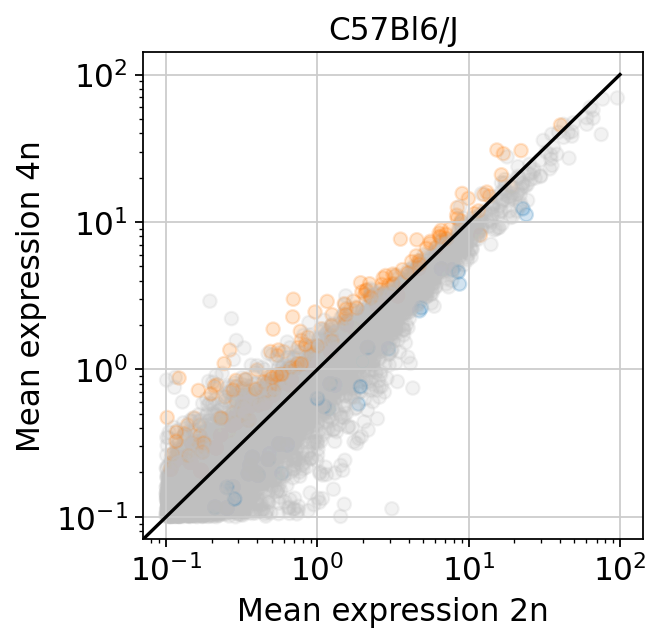

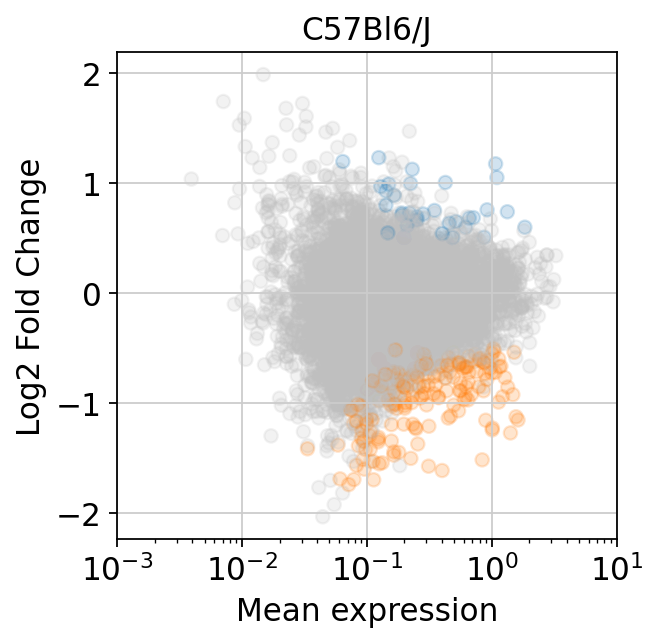

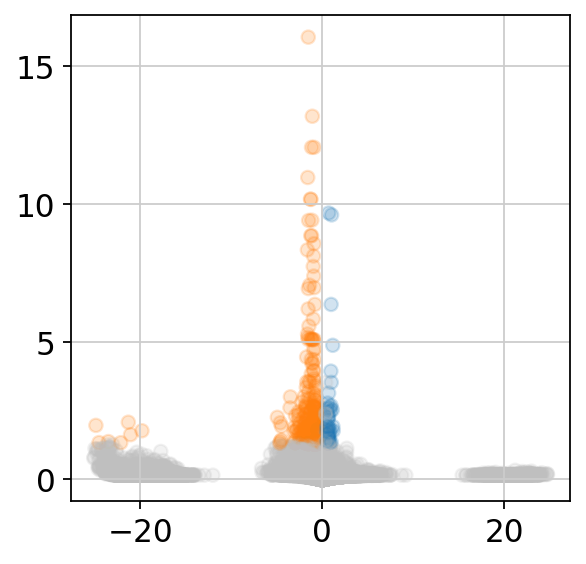

CEBPA KO


... storing 'exp.' as categorical
... storing 'age' as categorical
... storing 'sex' as categorical
... storing 'row' as categorical
... storing 'age_grouped' as categorical
... storing 'cyclone_phases' as categorical
... storing 'leiden_r1' as categorical
... storing 'leidenr02_02' as categorical


0 Hepatocytes
1 Hepatobiliary cells
2 Endothelial cells
3 Kupffer and Dendritic cells
4 Lymphocytes
5 Stellate cells
0 2n Hepatocytes
1 4n Hepatocytes
none     5654
up_4n      69
up_2n       2
Name: changes, dtype: int64


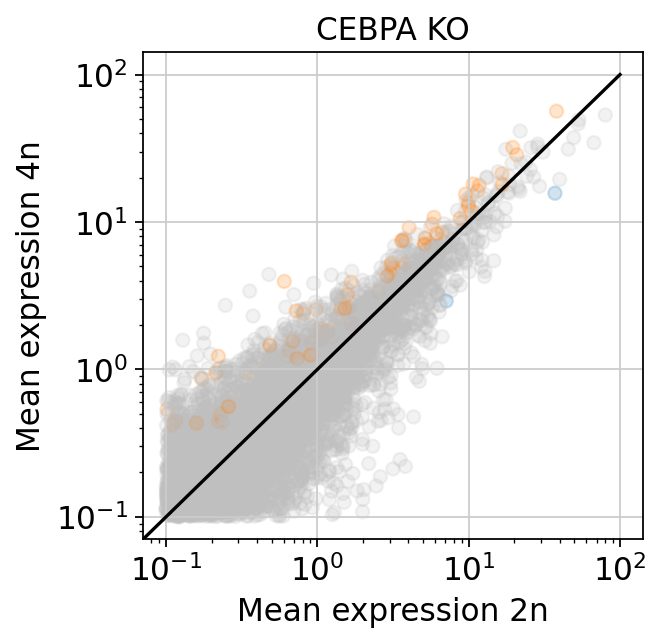

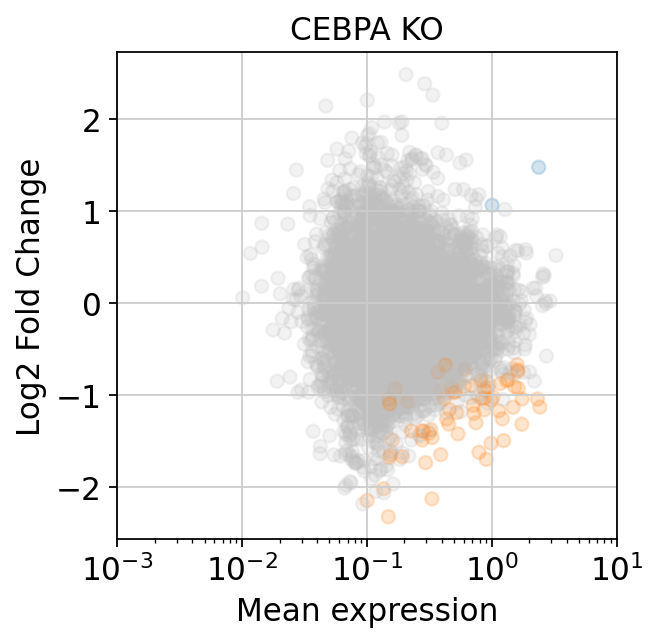

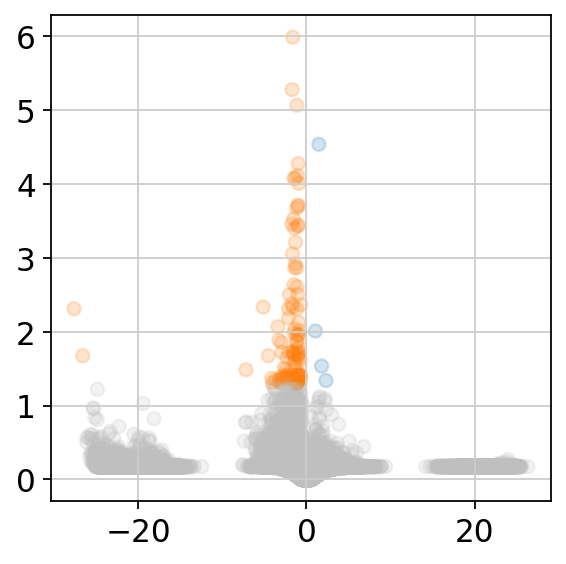

CTCF KO


... storing 'exp.' as categorical
... storing 'age' as categorical
... storing 'sex' as categorical
... storing 'row' as categorical
... storing 'age_grouped' as categorical
... storing 'cyclone_phases' as categorical
... storing 'leiden_r1' as categorical
... storing 'leidenr02_02' as categorical


0 Hepatocytes
1 Hepatobiliary cells
2 Endothelial cells
3 Kupffer and Dendritic cells
4 Lymphocytes
5 Stellate cells
0 2n Hepatocytes
1 4n Hepatocytes
none     6962
up_4n      32
up_2n       2
Name: changes, dtype: int64


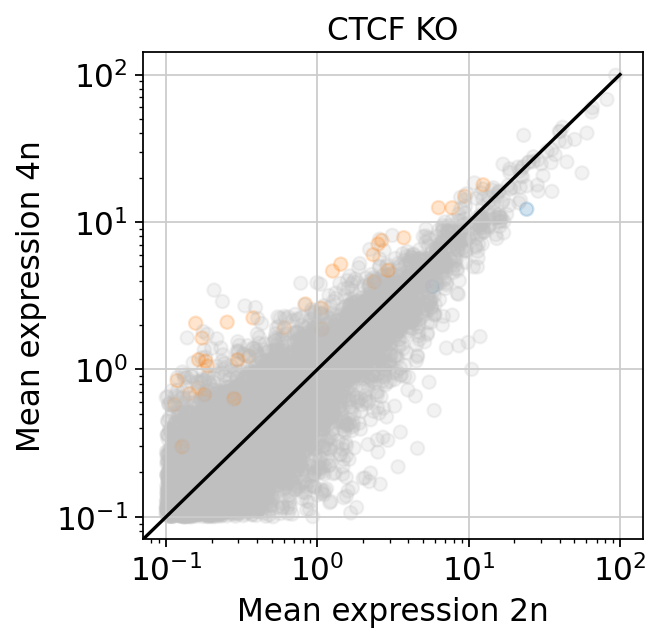

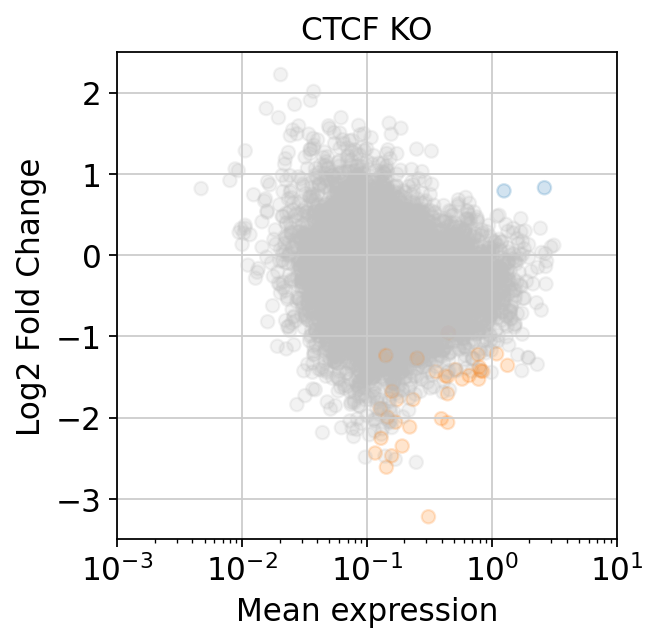

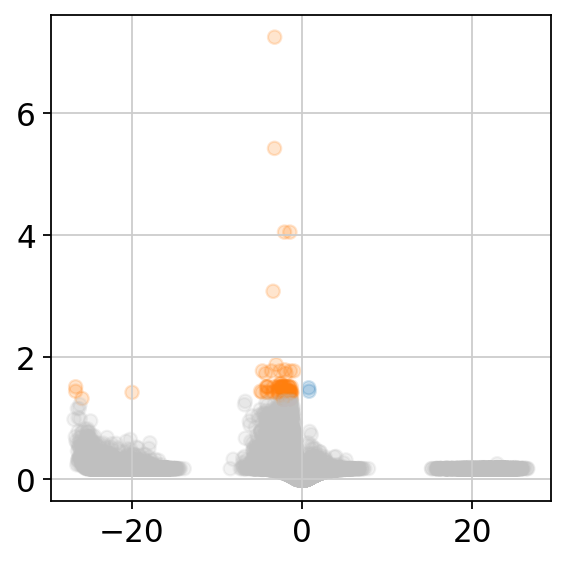

HNF4 KO


... storing 'exp.' as categorical
... storing 'age' as categorical
... storing 'sex' as categorical
... storing 'row' as categorical
... storing 'age_grouped' as categorical
... storing 'cyclone_phases' as categorical
... storing 'leiden_r1' as categorical
... storing 'leidenr02_02' as categorical


0 Hepatocytes
1 Hepatobiliary cells
2 Endothelial cells
3 Kupffer and Dendritic cells
4 Lymphocytes
5 Stellate cells
0 2n Hepatocytes
1 4n Hepatocytes
none     5264
up_4n     674
Name: changes, dtype: int64


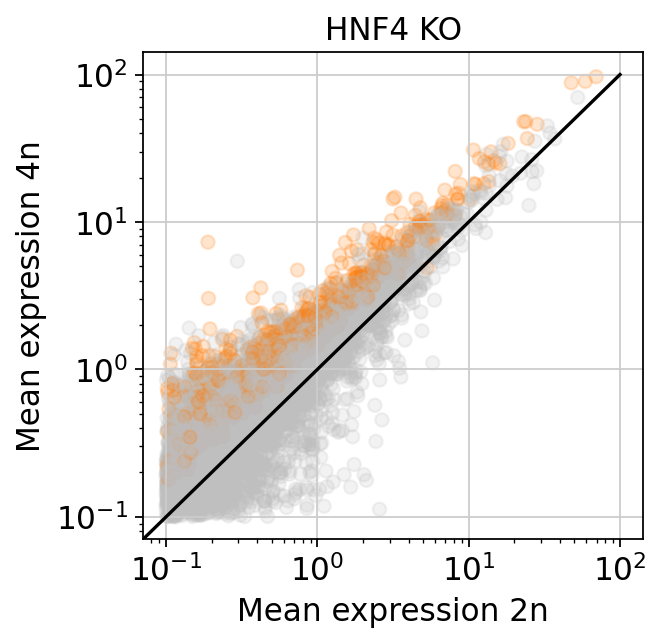

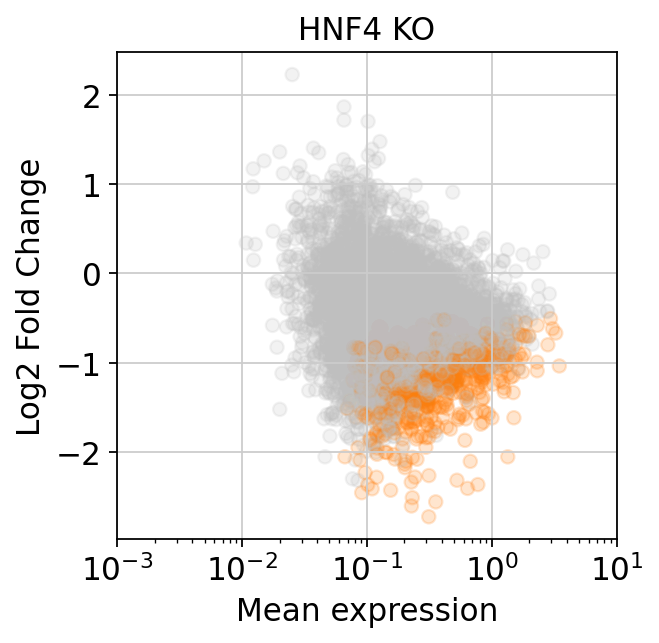

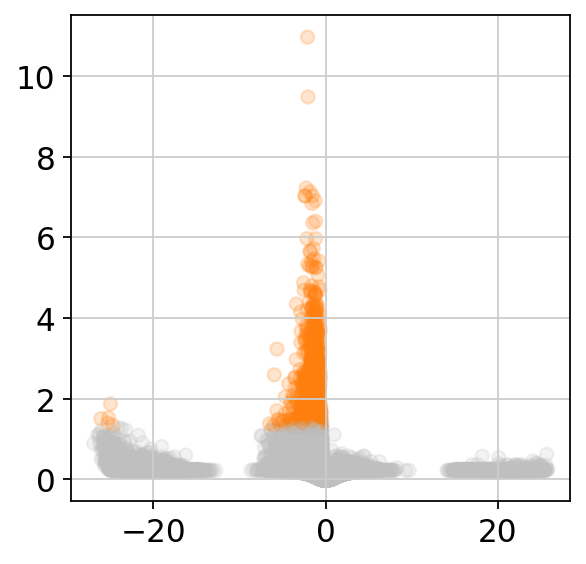

In [30]:
strain_key = adata_young.obs['strain'].cat.categories
for strain in strain_key:
    print(strain)
    adata_tmp = adata_young[adata_young.obs['strain']==strain].copy()
    adata_tmp.var['mean'] = adata_tmp.X.mean(axis=0)
    sc.tl.rank_genes_groups(adata_tmp, groupby="cell_type1", n_genes=adata_tmp.n_vars)
    dict_genes = adata_tmp.uns["rank_genes_groups"].copy()
    
    df = {}
    for idx, elem in enumerate(list(dict_genes["names"].dtype.names)):
        print(idx, elem)
        df[elem+"_gene"] = []
        df[elem+"_logfoldchange"] = []
        df[elem+"_pval_adj"] = []
        for j in range(0, len(adata.var)):
            df[elem+"_gene"].append(dict_genes["names"][j][idx])
            df[elem+"_logfoldchange"].append(dict_genes["logfoldchanges"][j][idx])
            df[elem+"_pval_adj"].append(dict_genes["pvals_adj"][j][idx])

    dataframe = pd.DataFrame(df)        
    for idx, elem in enumerate(list(dict_genes["names"].dtype.names)):
        adata_tmp.var[elem+"_mean"] = np.mean(adata_tmp[adata_tmp.obs["cell_type1"] == elem,:].layers["norm_counts"], axis=0)
        adata_tmp.var[elem+"_n_cells"] = np.sum(adata_tmp[adata_tmp.obs["cell_type1"] == elem,:].layers["norm_counts"] > 0, axis=0)
        dataframe.index = dataframe[elem+"_gene"]
        adata_tmp.var[elem+"_log2FC"] = dataframe[elem+"_logfoldchange"]
        adata_tmp.var[elem+"_pvals_adj"] = dataframe[elem+"_pval_adj"]
    #test 2n vs 4n hepatocytes    
    adata1_tmp = adata_tmp[adata_tmp.obs["cell_type1"] == "Hepatocytes",:].copy()
    sc.tl.rank_genes_groups(adata1_tmp, groupby="cell_type", n_genes=adata1_tmp.n_vars, method="t-test")
    dict_genes = adata1_tmp.uns["rank_genes_groups"].copy()
    df = {}
    for idx, elem in enumerate(list(dict_genes["names"].dtype.names)):
        print(idx, elem)
        df[elem+"_gene"] = []
        df[elem+"_logfoldchange"] = []
        df[elem+"_pval_adj"] = []
        for j in range(0, len(adata.var)):
            df[elem+"_gene"].append(dict_genes["names"][j][idx])
            df[elem+"_logfoldchange"].append(dict_genes["logfoldchanges"][j][idx])
            df[elem+"_pval_adj"].append(dict_genes["pvals_adj"][j][idx])

    dataframe = pd.DataFrame(df)        
    for idx, elem in enumerate(list(dict_genes["names"].dtype.names)):
        adata_tmp.var[elem+"_mean"] = np.mean(adata_tmp[adata_tmp.obs["cell_type"] == elem,:].layers["norm_counts"], axis=0)
        #adata.var[elem+"_sum"] = np.sum(adata[adata.obs["cell_type"] == elem,:].layers["norm_counts"], axis=0)
        adata_tmp.var[elem+"_n_cells"] = np.sum(adata_tmp[adata_tmp.obs["cell_type"] == elem,:].layers["norm_counts"] > 0, axis=0)
        dataframe.index = dataframe[elem+"_gene"]
        adata_tmp.var[elem+"_log2FC"] = dataframe[elem+"_logfoldchange"]
        adata_tmp.var[elem+"_pvals_adj"] = dataframe[elem+"_pval_adj"]
    changes = []
    for j in range(0, adata_tmp.n_vars):
        if adata_tmp.var["2n Hepatocytes_log2FC"][j] > 0.5 and adata_tmp.var["2n Hepatocytes_pvals_adj"][j] < 0.05:
            changes.append("up_2n")
        elif adata_tmp.var["4n Hepatocytes_log2FC"][j] > 0.5 and adata_tmp.var["4n Hepatocytes_pvals_adj"][j] < 0.05:
            changes.append("up_4n")
        else:
            changes.append("none")
        
    adata_tmp.var["changes_hep"] = changes 
    #save to file
    adata_tmp.var.to_csv(table_dir + today+ "_DE_young_" + strain.replace('/', '') + 
                         "_gene_expression_cell_types_and_ploidy_filter25.csv")
    
    #visualise differential expression results
    df = pd.DataFrame()
    df["mean_2n"] = adata_tmp.var["2n Hepatocytes_mean"]
    df["mean_4n"] = adata_tmp.var["4n Hepatocytes_mean"]
    df["cells_2n"] = adata_tmp.var["2n Hepatocytes_n_cells"]
    df["cells_4n"] = adata_tmp.var["4n Hepatocytes_n_cells"]
    df["changes"] = adata_tmp.var["changes_hep"]
    df['mean'] = adata_tmp.var['mean']
    df['log2FC'] = adata_tmp.var['2n Hepatocytes_log2FC']
    df.index = adata_tmp.var.index
    df1 = df[df["mean_2n"] > 0.1]
    df1 = df1[df1["mean_2n"] < 100]
    df2 = df1[df1["mean_4n"] > 0.1]
    df2 = df2[df2["mean_4n"] < 100]
    
    cols = []
    for elem in df2["changes"]:
        if elem == "up_2n":
            cols.append("#1f77b4")
        elif elem == "up_4n":
            cols.append("#ff7f0e")
        else:
            cols.append("0.75")

    print(pd.value_counts(df2.changes))
    #create plot
    fig = plt.scatter(x=df2["mean_2n"], y=df2["mean_4n"], c=cols, alpha=0.2)
    plt.xscale("log")
    plt.yscale("log")
    ident = [0.0, 100]
    plt.plot(ident,ident, color="k")
    plt.xlabel('Mean expression 2n')
    plt.ylabel('Mean expression 4n')
    plt.title(strain)
    plt.savefig("./figures/"+today+"_young_" + strain.replace('/', '') + "_mean_4n_vs_mean_2n_DE_filter25.pdf")
    plt.show()
    
    #create MA plot        
    fig = plt.scatter(x=df2['mean'], 
                      y=df2["log2FC"],
                      c=cols,alpha=0.2) 
    plt.xscale("log")
    plt.xlim((0.001, 10))
    plt.xlabel('Mean expression')
    plt.ylabel('Log2 Fold Change')
    plt.title(strain)
    plt.savefig("./figures/"+today+"_young_" + strain.replace('/', '') + "_MA_plot_4n_vs_2n_DE_filter25.pdf")
    plt.show()
    
    
    cols = []
    for elem in adata_tmp.var["changes_hep"]:
        if elem == "up_2n":
            cols.append("#1f77b4") #blue
        elif elem == "up_4n":
            cols.append("#ff7f0e") #orange
        else:
            cols.append("0.75")
    #create plot        
    fig = plt.scatter(y=-np.log10(adata_tmp.var["2n Hepatocytes_pvals_adj"]), 
                      x=adata_tmp.var["2n Hepatocytes_log2FC"],
                  c=cols,alpha=0.2)
    plt.show()
    
    


# DE test in old cells

Test 2n vs 4n hepatocytes in old cells (per strain).

In [31]:
adata_old = adata[adata.obs['age_grouped']=='old'].copy()

In [32]:
cell_compo_table(adata_old, 'strain' , 'cell_type1')

strain,C57Bl6/J,CEBPA KO,CTCF KO,HNF4 KO,All
cell_type1,,,,,
Hepatocytes,684,494,317,287,1782
Hepatobiliary cells,34,12,3,7,56
Endothelial cells,94,96,20,31,241
Kupffer and Dendritic cells,81,45,39,55,220
Lymphocytes,243,142,97,109,591
Stellate cells,39,55,28,19,141
All,1175,844,504,508,3031


In [33]:
cell_compo_table(adata_old, 'strain' , 'cell_type')

strain,C57Bl6/J,CEBPA KO,CTCF KO,HNF4 KO,All
cell_type,,,,,
2n Hepatocytes,173,190,100,73,536
4n Hepatocytes,511,304,217,214,1246
Hepatobiliary cells,34,12,3,7,56
Endothelial cells,94,96,20,31,241
Kupffer and Dendritic cells,81,45,39,55,220
Lymphocytes,243,142,97,109,591
Stellate cells,39,55,28,19,141
All,1175,844,504,508,3031


In [34]:
tmp_mask = adata_tmp.obs['cell_type1'].value_counts()[adata_tmp.obs['cell_type1'].value_counts()>1].index

C57Bl6/J


... storing 'exp.' as categorical
... storing 'age' as categorical
... storing 'sex' as categorical
... storing 'row' as categorical
... storing 'age_grouped' as categorical
... storing 'cyclone_phases' as categorical
... storing 'leiden_r1' as categorical
... storing 'leidenr02_02' as categorical


0 Hepatocytes
1 Hepatobiliary cells
2 Endothelial cells
3 Kupffer and Dendritic cells
4 Lymphocytes
5 Stellate cells
0 2n Hepatocytes
1 4n Hepatocytes
0.75       6706
#ff7f0e     133
#1f77b4      30
dtype: int64


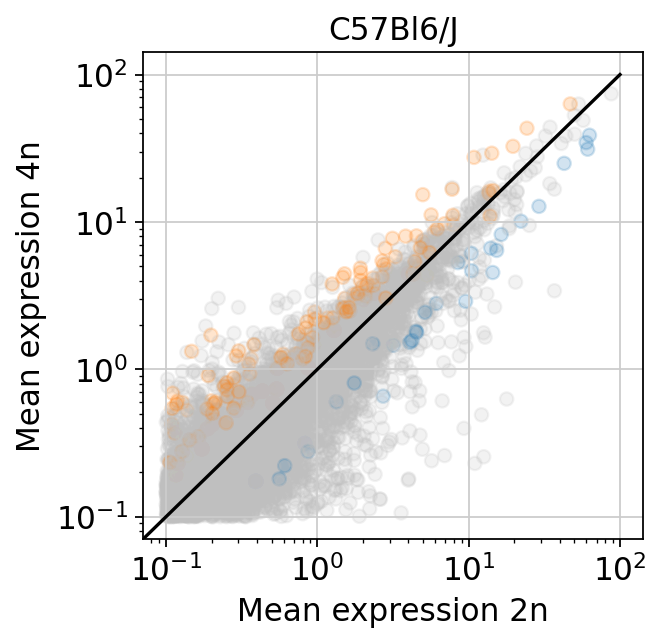

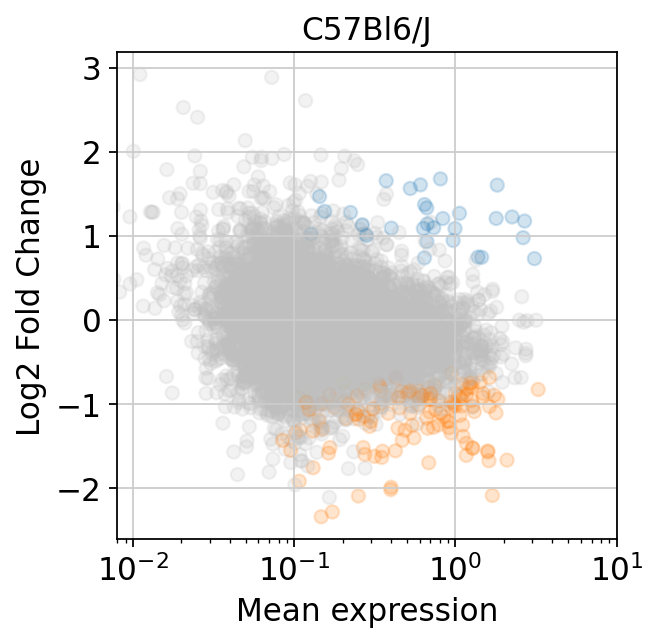

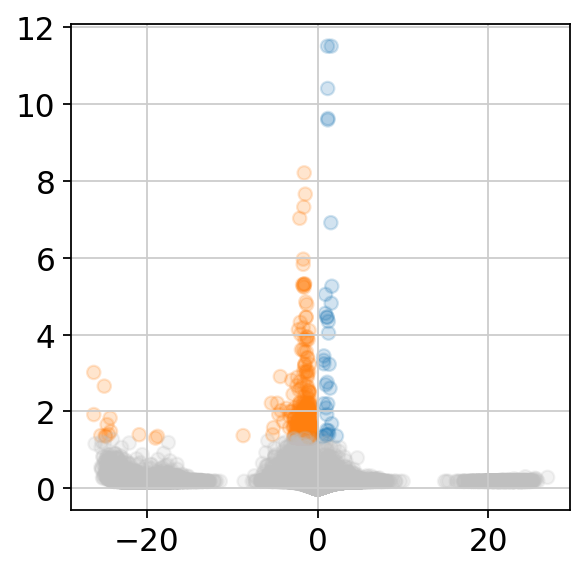

CEBPA KO


... storing 'exp.' as categorical
... storing 'age' as categorical
... storing 'sex' as categorical
... storing 'row' as categorical
... storing 'age_grouped' as categorical
... storing 'cyclone_phases' as categorical
... storing 'leiden_r1' as categorical
... storing 'leidenr02_02' as categorical


0 Hepatocytes
1 Hepatobiliary cells
2 Endothelial cells
3 Kupffer and Dendritic cells
4 Lymphocytes
5 Stellate cells
0 2n Hepatocytes
1 4n Hepatocytes
0.75       5579
#ff7f0e     212
#1f77b4       3
dtype: int64


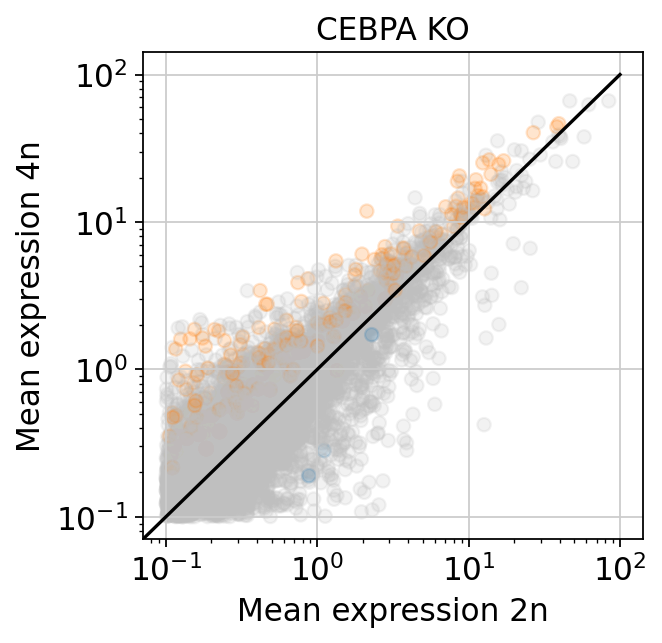

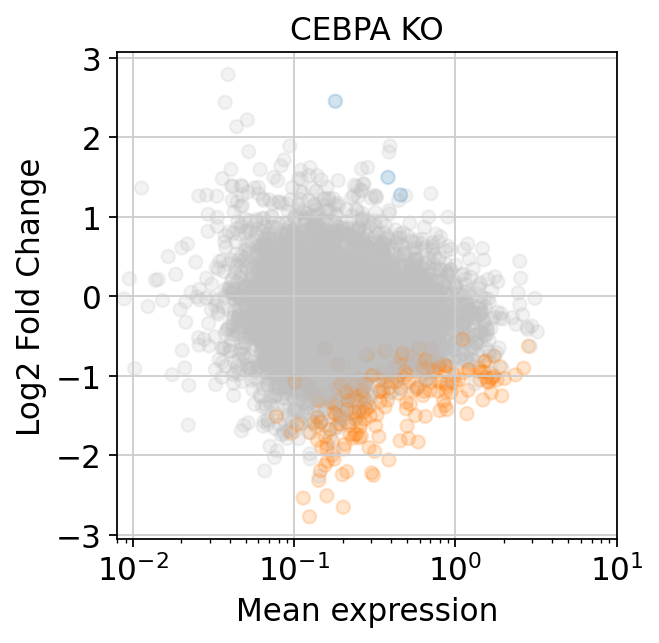

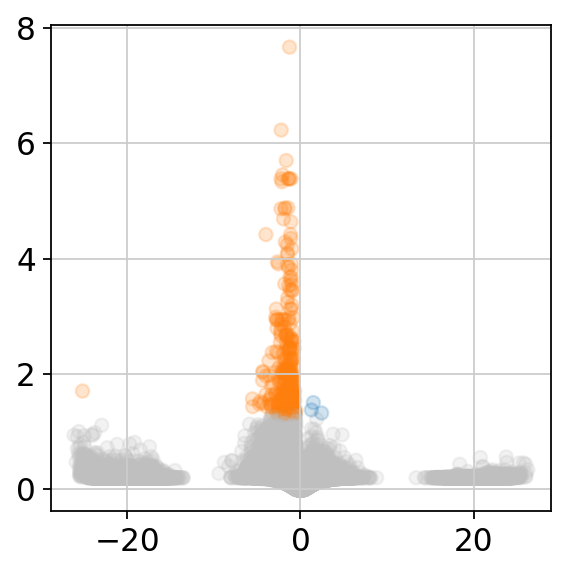

CTCF KO


... storing 'exp.' as categorical
... storing 'age' as categorical
... storing 'sex' as categorical
... storing 'row' as categorical
... storing 'age_grouped' as categorical
... storing 'cyclone_phases' as categorical
... storing 'leiden_r1' as categorical
... storing 'leidenr02_02' as categorical


0 Hepatocytes
1 Hepatobiliary cells
2 Endothelial cells
3 Kupffer and Dendritic cells
4 Lymphocytes
5 Stellate cells
0 2n Hepatocytes
1 4n Hepatocytes
0.75       6594
#ff7f0e     461
dtype: int64


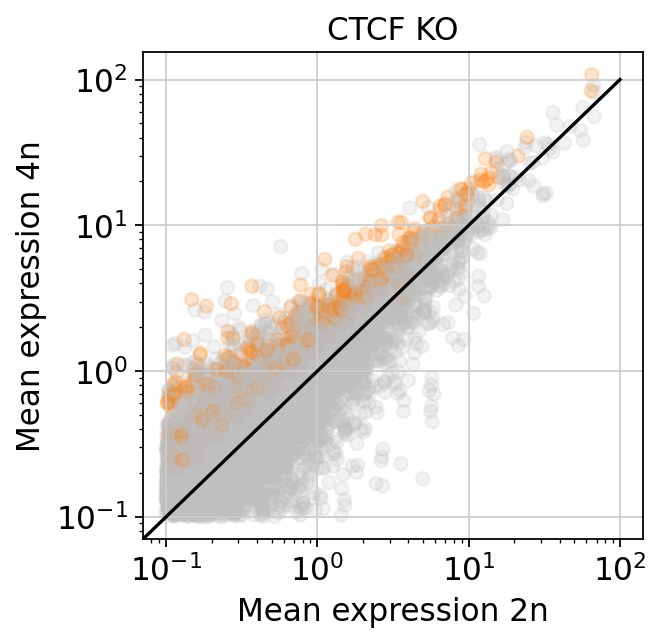

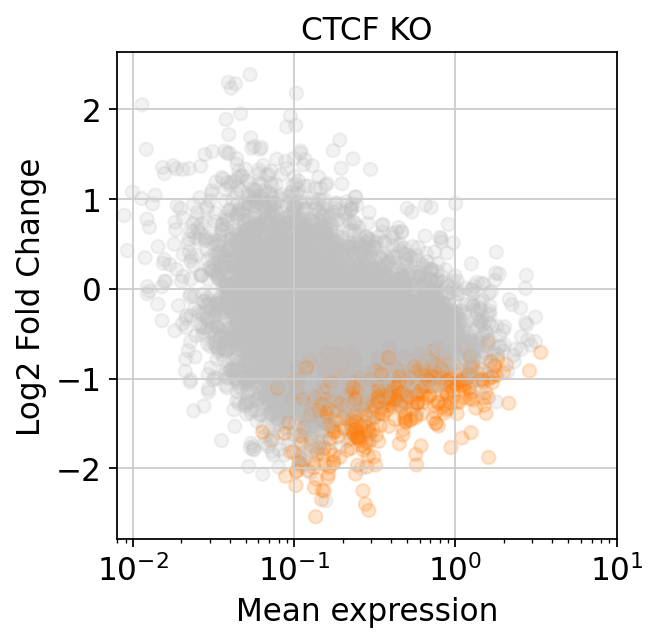

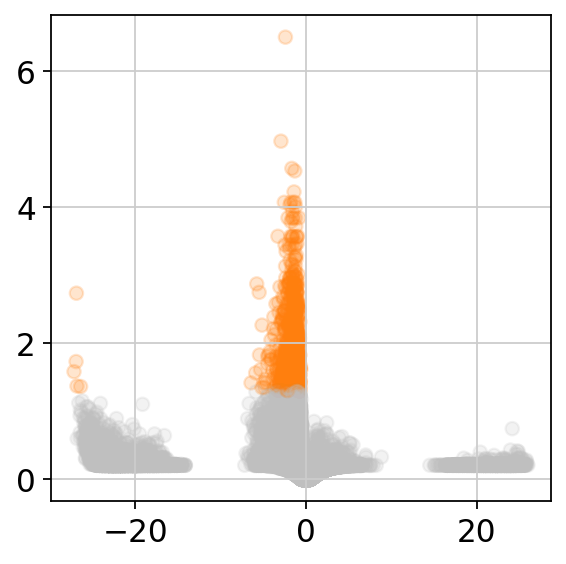

HNF4 KO


... storing 'exp.' as categorical
... storing 'age' as categorical
... storing 'sex' as categorical
... storing 'row' as categorical
... storing 'age_grouped' as categorical
... storing 'cyclone_phases' as categorical
... storing 'leiden_r1' as categorical
... storing 'leidenr02_02' as categorical


0 Hepatocytes
1 Hepatobiliary cells
2 Endothelial cells
3 Kupffer and Dendritic cells
4 Lymphocytes
5 Stellate cells
0 2n Hepatocytes
1 4n Hepatocytes
0.75       5390
#ff7f0e     567
dtype: int64


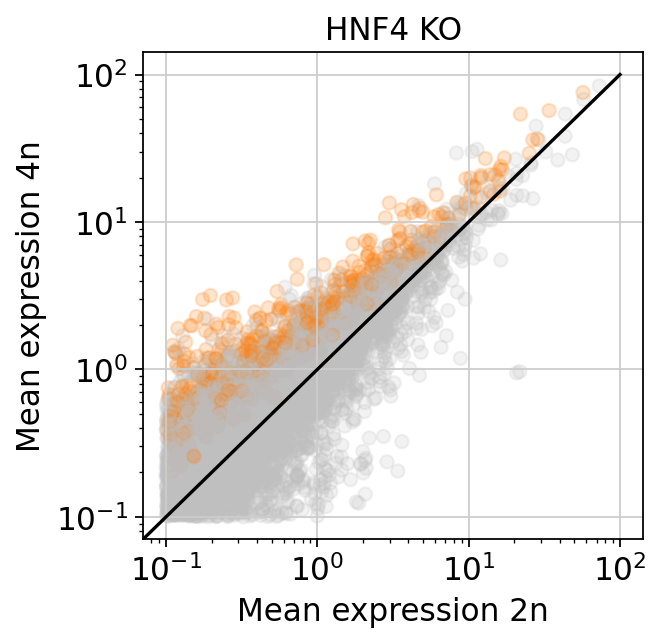

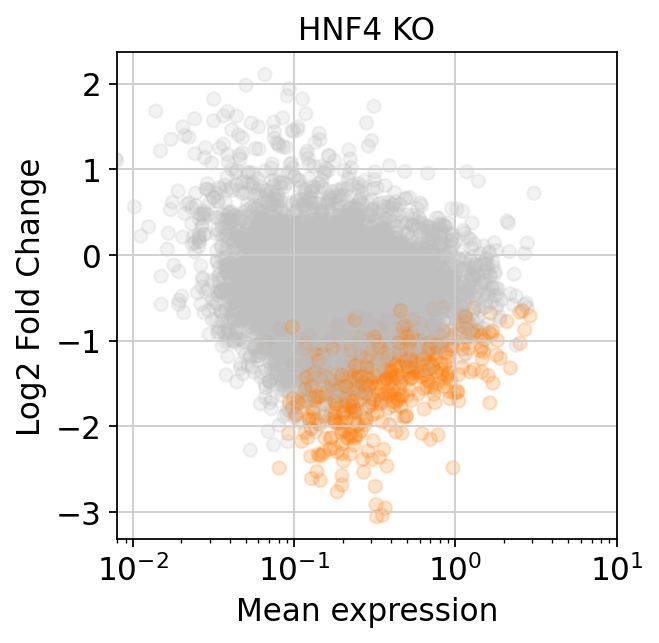

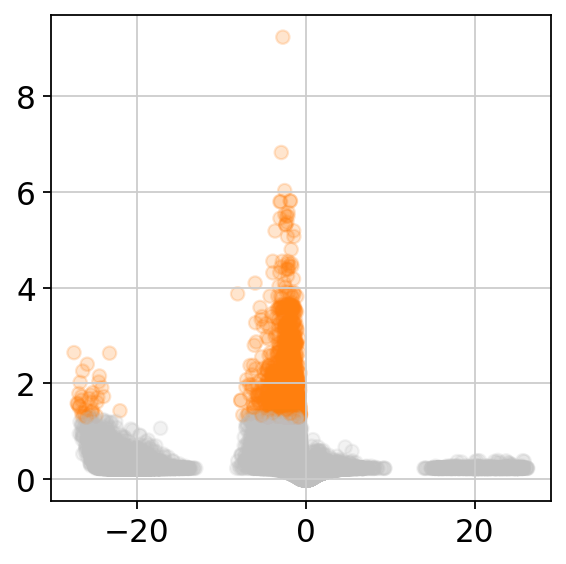

In [35]:
strain_key = adata_old.obs['strain'].cat.categories
for strain in strain_key:
    print(strain)
    adata_tmp = adata_old[adata_old.obs['strain']==strain].copy()
    adata_tmp.var['mean'] = adata_tmp.X.mean(axis=0)
    #use only cell types witho more than one cell
    tmp_mask = adata_tmp.obs['cell_type1'].value_counts()[adata_tmp.obs['cell_type1'].value_counts()>1].index
    adata_tmp = adata_tmp[np.in1d(adata_tmp.obs['cell_type1'],tmp_mask)].copy()
    sc.tl.rank_genes_groups(adata_tmp, groupby="cell_type1", n_genes=adata_tmp.n_vars)
    dict_genes = adata_tmp.uns["rank_genes_groups"].copy()
    
    df = {}
    for idx, elem in enumerate(list(dict_genes["names"].dtype.names)):
        print(idx, elem)
        df[elem+"_gene"] = []
        df[elem+"_logfoldchange"] = []
        df[elem+"_pval_adj"] = []
        for j in range(0, len(adata.var)):
            df[elem+"_gene"].append(dict_genes["names"][j][idx])
            df[elem+"_logfoldchange"].append(dict_genes["logfoldchanges"][j][idx])
            df[elem+"_pval_adj"].append(dict_genes["pvals_adj"][j][idx])

    dataframe = pd.DataFrame(df)        
    for idx, elem in enumerate(list(dict_genes["names"].dtype.names)):
        adata_tmp.var[elem+"_mean"] = np.mean(adata_tmp[adata_tmp.obs["cell_type1"] == elem,:].layers["norm_counts"], axis=0)
        adata_tmp.var[elem+"_n_cells"] = np.sum(adata_tmp[adata_tmp.obs["cell_type1"] == elem,:].layers["norm_counts"] > 0, axis=0)
        dataframe.index = dataframe[elem+"_gene"]
        adata_tmp.var[elem+"_log2FC"] = dataframe[elem+"_logfoldchange"]
        adata_tmp.var[elem+"_pvals_adj"] = dataframe[elem+"_pval_adj"]
    #test 2n vs 4n hepatocytes    
    adata1_tmp = adata_tmp[adata_tmp.obs["cell_type1"] == "Hepatocytes",:].copy()
    sc.tl.rank_genes_groups(adata1_tmp, groupby="cell_type", n_genes=adata1_tmp.n_vars, method="t-test")
    dict_genes = adata1_tmp.uns["rank_genes_groups"].copy()
    df = {}
    for idx, elem in enumerate(list(dict_genes["names"].dtype.names)):
        print(idx, elem)
        df[elem+"_gene"] = []
        df[elem+"_logfoldchange"] = []
        df[elem+"_pval_adj"] = []
        for j in range(0, len(adata.var)):
            df[elem+"_gene"].append(dict_genes["names"][j][idx])
            df[elem+"_logfoldchange"].append(dict_genes["logfoldchanges"][j][idx])
            df[elem+"_pval_adj"].append(dict_genes["pvals_adj"][j][idx])

    dataframe = pd.DataFrame(df)        
    for idx, elem in enumerate(list(dict_genes["names"].dtype.names)):
        adata_tmp.var[elem+"_mean"] = np.mean(adata_tmp[adata_tmp.obs["cell_type"] == elem,:].layers["norm_counts"], axis=0)
        #adata.var[elem+"_sum"] = np.sum(adata[adata.obs["cell_type"] == elem,:].layers["norm_counts"], axis=0)
        adata_tmp.var[elem+"_n_cells"] = np.sum(adata_tmp[adata_tmp.obs["cell_type"] == elem,:].layers["norm_counts"] > 0, axis=0)
        dataframe.index = dataframe[elem+"_gene"]
        adata_tmp.var[elem+"_log2FC"] = dataframe[elem+"_logfoldchange"]
        adata_tmp.var[elem+"_pvals_adj"] = dataframe[elem+"_pval_adj"]
    changes = []
    for j in range(0, adata_tmp.n_vars):
        if adata_tmp.var["2n Hepatocytes_log2FC"][j] > 0.5 and adata_tmp.var["2n Hepatocytes_pvals_adj"][j] < 0.05:
            changes.append("up_2n")
        elif adata_tmp.var["4n Hepatocytes_log2FC"][j] > 0.5 and adata_tmp.var["4n Hepatocytes_pvals_adj"][j] < 0.05:
            changes.append("up_4n")
        else:
            changes.append("none")
        
    adata_tmp.var["changes_hep"] = changes 
    #save to file
    adata_tmp.var.to_csv(table_dir + today+ "_DE_old_" + strain.replace('/', '') + 
                         "_gene_expression_cell_types_and_ploidy_filter25.csv")
    
    #visualise differential expression results
    df = pd.DataFrame()
    df["mean_2n"] = adata_tmp.var["2n Hepatocytes_mean"]
    df["mean_4n"] = adata_tmp.var["4n Hepatocytes_mean"]
    df["cells_2n"] = adata_tmp.var["2n Hepatocytes_n_cells"]
    df["cells_4n"] = adata_tmp.var["4n Hepatocytes_n_cells"]
    df["changes"] = adata_tmp.var["changes_hep"]
    df['mean'] = adata_tmp.var['mean']
    df['log2FC'] = adata_tmp.var['2n Hepatocytes_log2FC']
    df.index = adata_tmp.var.index
    df1 = df[df["mean_2n"] > 0.1]
    df1 = df1[df1["mean_2n"] < 100]
    df2 = df1[df1["mean_4n"] > 0.1]
    df2 = df2[df2["mean_2n"] < 100]
    
    
    cols = []
    for elem in df2["changes"]:
        if elem == "up_2n":
            cols.append("#1f77b4") #blue
        elif elem == "up_4n":
            cols.append("#ff7f0e") #orange
        else:
            cols.append("0.75")

    print(pd.value_counts(cols))
    #create plot
    fig = plt.scatter(x=df2["mean_2n"], y=df2["mean_4n"], c=cols, alpha=0.2)
    plt.xscale("log")
    plt.yscale("log")
    ident = [0.0, 100]
    plt.plot(ident,ident, color="k")
    plt.xlabel('Mean expression 2n')
    plt.ylabel('Mean expression 4n')
    plt.title(strain)
    plt.savefig("./figures/"+today+"_old_" + strain.replace('/', '') + "_mean_4n_vs_mean_2n_DE_filter25.pdf")
    plt.show()
    
    #create MA plot        
    fig = plt.scatter(x=df2['mean'], 
                      y=df2["log2FC"],
                      c=cols,alpha=0.2) 
    plt.xscale("log")
    plt.xlim((0.008, 10))
    plt.xlabel('Mean expression')
    plt.ylabel('Log2 Fold Change')
    plt.title(strain)
    plt.savefig("./figures/"+today+"_old_" + strain.replace('/', '') + "_MA_plot_4n_vs_2n_DE_filter25.pdf")
    plt.show()
    
    cols = []
    for elem in adata_tmp.var["changes_hep"]:
        if elem == "up_2n":
            cols.append("#1f77b4") #blue
        elif elem == "up_4n":
            cols.append("#ff7f0e") #orange
        else:
            cols.append("0.75")
    #create plot        
    fig = plt.scatter(y=-np.log10(adata_tmp.var["2n Hepatocytes_pvals_adj"]), 
                      x=adata_tmp.var["2n Hepatocytes_log2FC"],
                  c=cols,alpha=0.2) 
    plt.show()

# DE test young vs old hepatocytes

In this section, we test young vs old cells per cell type in every strain. In the case of hepatocytes, we take hepatocyte as one group (do not distinguish 2n and 4n). In addition, we split the hepatocytes by 2n and 4n and add a test for these subgroups. In the result table, we include column for mean expression for young and old (not just logFC)!

We merge `adata_young` and `adata_old` in order to use the separately created cell type annotation.

In [27]:
adata_all = ann.concat([adata_young, adata_old], index_unique=None)

In [28]:
adata_all.uns = adata_old.uns
adata_all.var['gene_name'] = adata_old.var['gene_name']

In [29]:
adata_all

AnnData object with n_obs × n_vars = 6605 × 30520
    obs: 'batch', 'exp.', 'libraryID', 'experiment', 'strain', 'age', 'sex', 'ploidy', 'ERCC.dilution', 'column', 'row', 'percentERCC', 'n_counts', 'age_grouped', 'n_counts_raw', 'n_counts_transcripts', 'n_counts_ERCC', 'n_genes', 'high_ERCC', 'low_ERCC', 'low_genes', 'high_genes', 'low_counts', 'high_counts', 'ERCC_size_factor', 'n_counts_TPM', 'RPK_factor', 'n_counts_TPM_norm', 'mean_transcript_count_TPM', 'cyclone_phases', 'score_G1', 'score_S', 'score_G2M', 'leiden_r1', 'leiden_r02', 'low_res_ct', 'clusters', 'score_Natural killer', 'score_Lymphocyte', 'score_Hepatoblast', 'score_Endothelial', 'score_Dendritic cell', 'score_B cells', 'score_Cholangiocyte', 'score_Kupffer and Macrophage', 'score_Hepatocyte', 'score_Neutrophil', 'leidenr02_02', 'cell_type', 'hblast_marker_sum', 'cell_type1', 'ploidy_age_strain'
    var: 'gene_name'
    uns: 'ERCC.dilution_colors', 'age_colors', 'age_grouped_colors', 'cell_type1_colors', 'cell_type_col

... storing 'exp.' as categorical
... storing 'age' as categorical
... storing 'sex' as categorical
... storing 'row' as categorical
... storing 'age_grouped' as categorical
... storing 'cyclone_phases' as categorical
... storing 'leiden_r1' as categorical
... storing 'leidenr02_02' as categorical
... storing 'ploidy_age_strain' as categorical


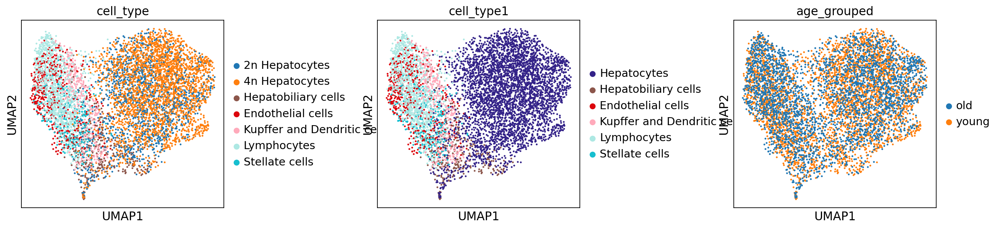

In [30]:
sc.pl.umap(adata_all, color=['cell_type', 'cell_type1', 'age_grouped'], wspace=0.6)

In [31]:
strain_keys = adata_all.obs['strain'].cat.categories
cell_type_keys = adata_all.obs['cell_type1'].cat.categories
for strain_key in strain_keys:
    print('Examine ' + strain_key)
    for cell_type_key in cell_type_keys:
        print('Test ' + cell_type_key)
        adata_tmp = adata_all[np.logical_and(adata_all.obs['strain']==strain_key,
                                             adata_all.obs['cell_type1']==cell_type_key
                                            )].copy()
        if np.sum(adata_tmp.obs['age_grouped'].value_counts().values<2):
            continue
        sc.tl.rank_genes_groups(adata_tmp, groupby="age_grouped", n_genes=adata_tmp.n_vars)
        dict_genes = adata_tmp.uns["rank_genes_groups"].copy()
        
        df = {}
        for idx, elem in enumerate(list(dict_genes["names"].dtype.names)):
            print(idx, elem)
            df[elem+"_gene"] = []
            df[elem+"_logfoldchange"] = []
            df[elem+"_pval_adj"] = []
            for j in range(0, len(adata.var)):
                df[elem+"_gene"].append(dict_genes["names"][j][idx])
                df[elem+"_logfoldchange"].append(dict_genes["logfoldchanges"][j][idx])
                df[elem+"_pval_adj"].append(dict_genes["pvals_adj"][j][idx])

        dataframe = pd.DataFrame(df)        
        for idx, elem in enumerate(list(dict_genes["names"].dtype.names)):
            adata_tmp.var[elem+"_mean"] = np.mean(adata_tmp[adata_tmp.obs["age_grouped"] == elem,:].layers["norm_counts"], axis=0)
            adata_tmp.var[elem+"_n_cells"] = np.sum(adata_tmp[adata_tmp.obs["age_grouped"] == elem,:].layers["norm_counts"] > 0, axis=0)
            dataframe.index = dataframe[elem+"_gene"]
            adata_tmp.var[elem+"_log2FC"] = dataframe[elem+"_logfoldchange"]
            adata_tmp.var[elem+"_pvals_adj"] = dataframe[elem+"_pval_adj"]
      
        #save to file
        #adata_tmp.var.to_csv(table_dir + today + "_DE_test_young_vs_old_" + strain_key.replace('/', '') + '_' + cell_type_key + "_gene_expression_filter25.csv")
        

Examine C57Bl6/J
Test Hepatocytes
0 old
1 young
Test Hepatobiliary cells
0 old
1 young
Test Endothelial cells
0 old
1 young
Test Kupffer and Dendritic cells
0 old
1 young
Test Lymphocytes
0 old
1 young
Test Stellate cells
0 old
1 young
Examine CEBPA KO
Test Hepatocytes
0 old
1 young
Test Hepatobiliary cells
0 old
1 young
Test Endothelial cells
0 old
1 young
Test Kupffer and Dendritic cells
0 old
1 young
Test Lymphocytes
0 old
1 young
Test Stellate cells
0 old
1 young
Examine CTCF KO
Test Hepatocytes
0 old
1 young
Test Hepatobiliary cells
0 old
1 young
Test Endothelial cells
0 old
1 young
Test Kupffer and Dendritic cells
0 old
1 young
Test Lymphocytes
0 old
1 young
Test Stellate cells
0 old
1 young
Examine HNF4 KO
Test Hepatocytes
0 old
1 young
Test Hepatobiliary cells
0 old
1 young
Test Endothelial cells
0 old
1 young
Test Kupffer and Dendritic cells
0 old
1 young
Test Lymphocytes
0 old
1 young
Test Stellate cells
0 old
1 young


Repeat for `2n` and `4n` hepatocytes separately.

Examine C57Bl6/J
Test 2n Hepatocytes
0 old
1 young
Reference: old
0 old
1 young
none        6245
up_young     817
up_old        50
Name: changes, dtype: int64


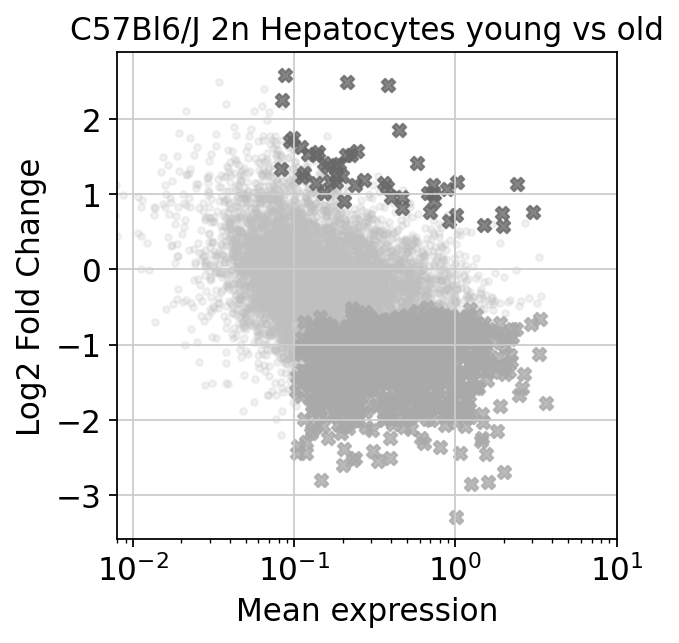

Test 4n Hepatocytes
0 old
1 young
Reference: old
0 old
1 young
none        6305
up_young    1022
up_old        79
Name: changes, dtype: int64


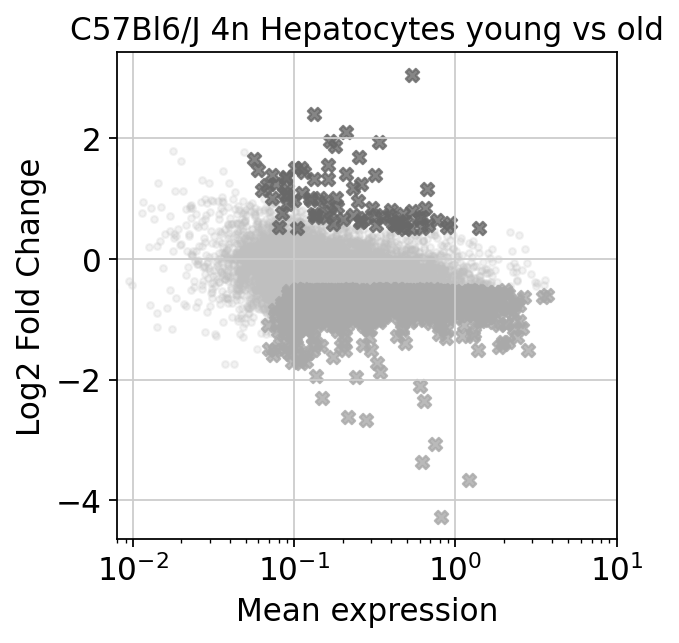

Examine CEBPA KO
Test 2n Hepatocytes
0 old
1 young
Reference: old
0 old
1 young
none        5554
up_young       3
Name: changes, dtype: int64


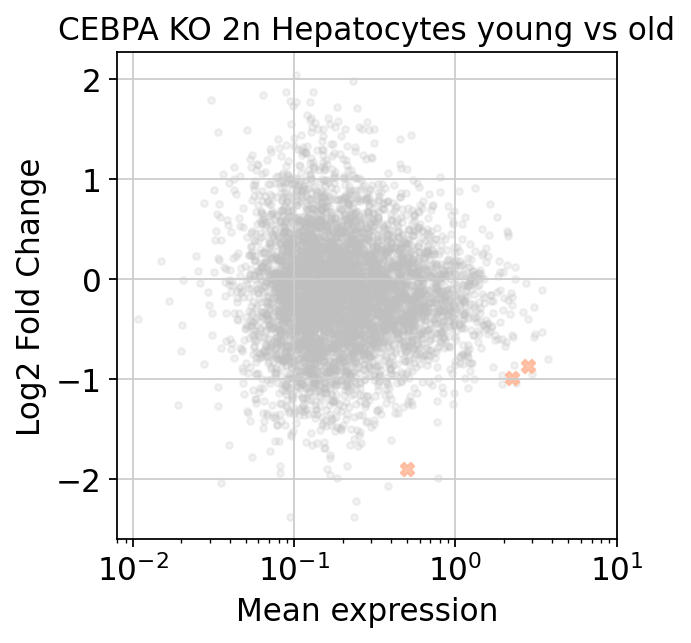

Test 4n Hepatocytes
0 old
1 young
Reference: old
0 old
1 young
none        5944
up_young      67
up_old        42
Name: changes, dtype: int64


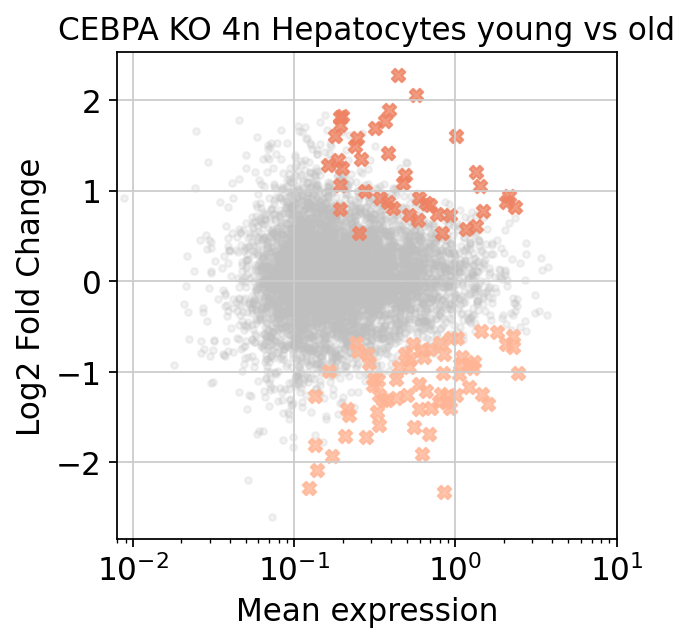

Examine CTCF KO
Test 2n Hepatocytes
0 old
1 young
Reference: old
0 old
1 young
none        6332
up_young       4
up_old         1
Name: changes, dtype: int64


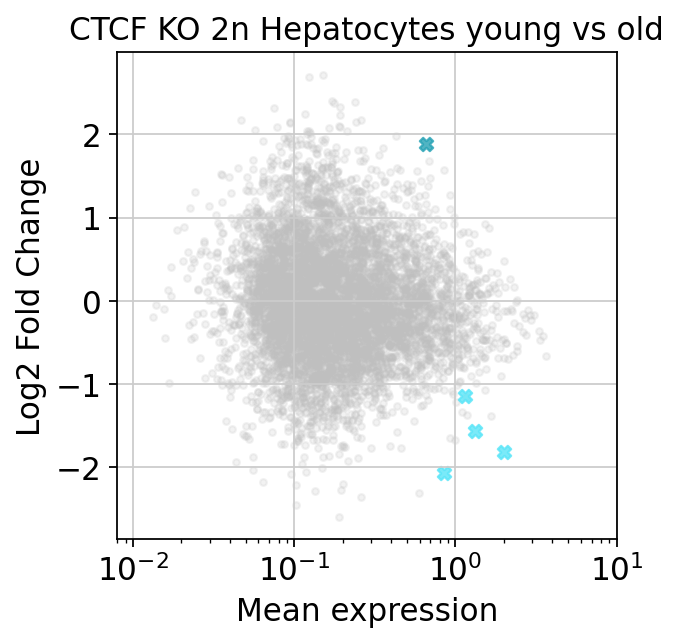

Test 4n Hepatocytes
0 old
1 young
Reference: old
0 old
1 young
none        7767
up_old        50
up_young      18
Name: changes, dtype: int64


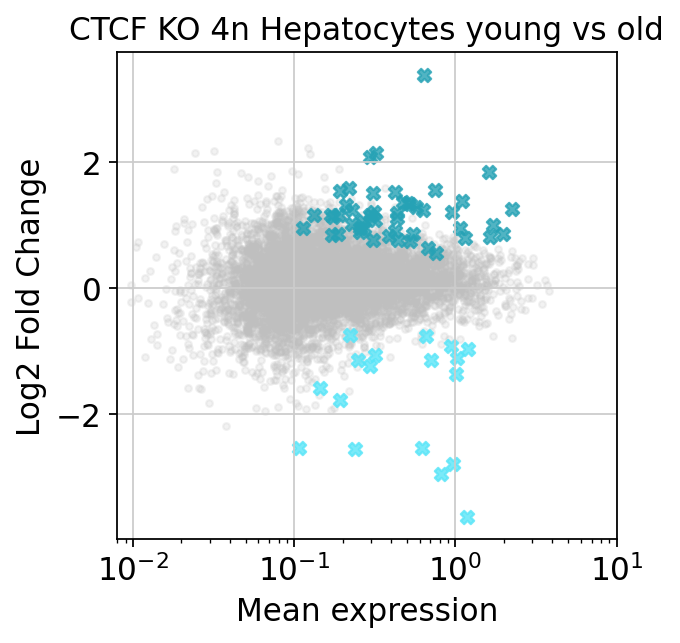

Examine HNF4 KO
Test 2n Hepatocytes
0 old
1 young
Reference: old
0 old
1 young
none        5140
up_young       3
Name: changes, dtype: int64


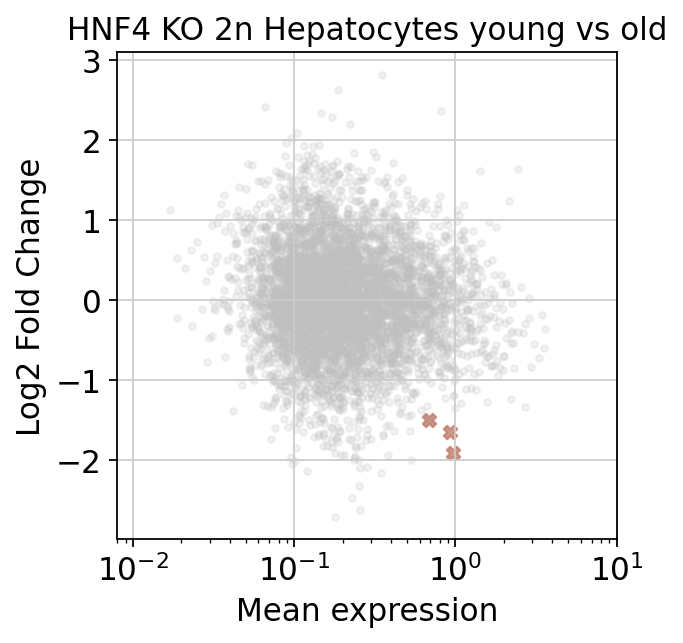

Test 4n Hepatocytes
0 old
1 young
Reference: old
0 old
1 young
none        7119
up_young     123
up_old        59
Name: changes, dtype: int64


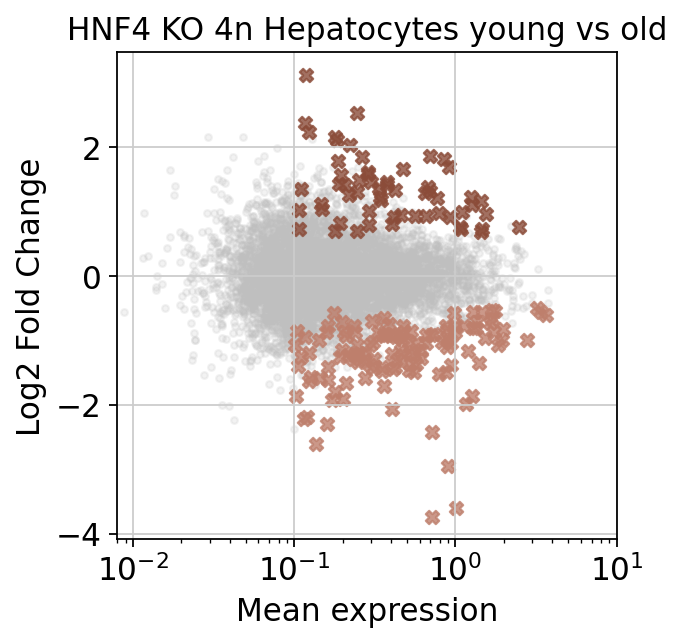

In [39]:
strain_keys = adata_all.obs['strain'].cat.categories

strain_color_dict = {
    'C57Bl6/J': [ '#a9a9a9','#686868'], #[old, young]
    'HNF4 KO': [ '#BE7F6C','#8B4C39'],
    'CEBPA KO': [ '#FFB595','#EE8262'],
    'CTCF KO': [ '#59E5F8','#26a2b5']
}

cell_type_keys = ['2n Hepatocytes', '4n Hepatocytes']
for strain_key in strain_keys:
    print('Examine ' + strain_key)
    for cell_type_key in cell_type_keys:
        print('Test ' + cell_type_key)
        adata_tmp = adata_all[np.logical_and(adata_all.obs['strain']==strain_key,
                                             adata_all.obs['cell_type']==cell_type_key
                                            )].copy()
        adata_tmp.var['mean'] = adata_tmp.X.mean(axis=0)
        if np.sum(adata_tmp.obs['age_grouped'].value_counts().values<2):
            continue
        sc.tl.rank_genes_groups(adata_tmp, groupby="age_grouped", n_genes=adata_tmp.n_vars)
        dict_genes = adata_tmp.uns["rank_genes_groups"].copy()
        
        df = {}
        for idx, elem in enumerate(list(dict_genes["names"].dtype.names)):
            print(idx, elem)
            df[elem+"_gene"] = []
            df[elem+"_logfoldchange"] = []
            df[elem+"_pval_adj"] = []
            for j in range(0, len(adata.var)):
                df[elem+"_gene"].append(dict_genes["names"][j][idx])
                df[elem+"_logfoldchange"].append(dict_genes["logfoldchanges"][j][idx])
                df[elem+"_pval_adj"].append(dict_genes["pvals_adj"][j][idx])

        dataframe = pd.DataFrame(df)        
        for idx, elem in enumerate(list(dict_genes["names"].dtype.names)):
            adata_tmp.var[elem+"_mean"] = np.mean(adata_tmp[adata_tmp.obs["age_grouped"] == elem,:].layers["norm_counts"], axis=0)
            adata_tmp.var[elem+"_n_cells"] = np.sum(adata_tmp[adata_tmp.obs["age_grouped"] == elem,:].layers["norm_counts"] > 0, axis=0)
            dataframe.index = dataframe[elem+"_gene"]
            adata_tmp.var[elem+"_log2FC"] = dataframe[elem+"_logfoldchange"]
            adata_tmp.var[elem+"_pvals_adj"] = dataframe[elem+"_pval_adj"]
        
        #get names of test levels
        ref_name = list(dict_genes["names"].dtype.names)[0]
        test_name = list(dict_genes["names"].dtype.names)[1]
        print('Reference: ' + ref_name)
        
        changes = []
        for j in range(0, adata_tmp.n_vars):
            if adata_tmp.var[ref_name + "_log2FC"][j] > 0.5 and adata_tmp.var[ref_name + "_pvals_adj"][j] < 0.05:
                changes.append("up_" + ref_name)
            elif adata_tmp.var[test_name + "_log2FC"][j] > 0.5 and adata_tmp.var[test_name + "_pvals_adj"][j] < 0.05:
                changes.append("up_" + test_name)
            else:
                changes.append("none")
        
        adata_tmp.var["changes_hep"] = changes 
        
        #save to file
        #adata_tmp.var.to_csv(table_dir + "DE_test_young_vs_old_" + strain_key.replace('/', '') + '_' + cell_type_key + "_gene_expression_"+ today +"_filter25.csv")
        
        
        
        #visualise differential expression results
        df = pd.DataFrame()
        for idx, elem in enumerate(list(dict_genes["names"].dtype.names)):
            print(idx, elem)
            df["mean_" +elem] = adata_tmp.var[elem+"_mean"]
            df["mean_" +elem] = adata_tmp.var[elem+"_mean"]
        df["changes"] = adata_tmp.var["changes_hep"]
        df['mean'] = adata_tmp.var['mean']
        df['log2FC'] = adata_tmp.var[ref_name + '_log2FC']
        df.index = adata_tmp.var.index
        #subset 
        df1 = df[df["mean_" + ref_name] > 0.1]
        df1 = df1[df1["mean_" + ref_name] < 100]
        df2 = df1[df1["mean_" + test_name] > 0.1]
        df2 = df2[df2["mean_" +test_name] < 100]
    
        cols = []
        shape = []
        for elem in df2["changes"]:
            if elem == "up_" +ref_name:
                cols.append(strain_color_dict[strain_key][1])
                #cols.append("#000000") #black
                #shape.append('s')
                shape.append('X')
            elif elem == "up_" + test_name:
                cols.append(strain_color_dict[strain_key][0])
                #cols.append("#000000") #black
                shape.append('X')
            else:
                cols.append("0.75")
                shape.append('.')

        print(df2.changes.value_counts())
        
    
        #create MA plot    
        alpha_val = [0.2, 0.8,0.8]
        for idx, lev in enumerate(df2.changes.unique()):
            level = (df2.changes == lev).values
            markers = [shap[1] for shap in enumerate(shape) if level[shap[0]]]
            color_sub = [colid[1] for colid in enumerate(cols) if level[colid[0]]]
            plt.scatter(x=df2['mean'][level], 
                        y=df2["log2FC"][level], 
                        marker= markers[0],
                        c= color_sub[0],
                        alpha=alpha_val[idx]) 
        plt.xscale("log")
        plt.xlim((0.008, 10))
        plt.xlabel('Mean expression')
        plt.ylabel('Log2 Fold Change')
        plt.title(strain_key + ' ' + cell_type_key + ' young vs old')
        plt.savefig("./figures/" +today + '_' +cell_type_key + '_' + strain_key.replace('/', '') + "_MA_plot_young_vs_old_DE_filter25.pdf")
        plt.show()
    

End of the notebook.